In [14]:
!pip install --quiet networkx matplotlib pandas scikit-learn

import pandas as pd
import numpy as np
import networkx as nx
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import StandardScaler   # <-- EKLEDİK
import matplotlib.pyplot as plt
import os

In [15]:
# Eğer Colab kullanıyorsan: sol panelden "Files" -> upload ile csv yükleyebilirsin
# Örnek: spotify.csv olarak yüklendiğini varsayıyorum.
DATA_PATH = "/content/spotify_data.csv"  # kendi dosya adını buraya yaz

# Eğer Drive kullanmak istersen:
# from google.colab import drive
# drive.mount('/content/drive')
# DATA_PATH = "/content/drive/MyDrive/yourfolder/spotify.csv"

df = pd.read_csv(DATA_PATH)
df.head()

,Unnamed: 0,artist_name,track_name,track_id,popularity,year,genre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,0,Jason Mraz,I Won't Give Up,53QF56cjZA9RTuuMZDrSA6,68,2012,acoustic,0.483,0.303,4,-10.058,1,0.0429,0.6940,0.000000,0.1150,0.139,133.406,240166,3
1,1,Jason Mraz,93 Million Miles,1s8tP3jP4GZcyHDsjvw218,50,2012,acoustic,0.572,0.454,3,-10.286,1,0.0258,0.4770,0.000014,0.0974,0.515,140.182,216387,4
2,2,Joshua Hyslop,Do Not Let Me Go,7BRCa8MPiyuvr2VU3O9W0F,57,2012,acoustic,0.409,0.234,3,-13.711,1,0.0323,0.3380,0.000050,0.0895,0.145,139.832,158960,4
3,3,Boyce Avenue,Fast Car,63wsZUhUZLlh1OsyrZq7sz,58,2012,acoustic,0.392,0.251,10,-9.845,1,0.0363,0.8070,0.000000,0.0797,0.508,204.961,304293,4
4,4,Andrew Belle,Sky's Still Blue,6nXIYClvJAfi6ujLiKqEq8,54,2012,acoustic,0.430,0.791,6,-5.419,0,0.0302,0.0726,0.019300,0.1100,0.217,171.864,244320,4



📊 Graf Bilgileri:
   Düğüm Sayısı: 10
   Kenar Sayısı: 37

🎵 İLK 10 ŞARKI MALATYA CENTRALITY DEĞERLERİ:
----------------------------------------------------------------------
Düğüm 0: 4.4405 (Derece: 6) - Jason Mraz - I Won't Give Up
Düğüm 1: 8.7302 (Derece: 8) - Jason Mraz - 93 Million Miles
Düğüm 2: 8.7302 (Derece: 8) - Joshua Hyslop - Do Not Let Me Go
Düğüm 3: 6.6389 (Derece: 7) - Boyce Avenue - Fast Car
Düğüm 4: 4.6905 (Derece: 6) - Andrew Belle - Sky's Still Blue
Düğüm 5: 6.3472 (Derece: 7) - Chris Smither - What They Say
Düğüm 6: 11.4464 (Derece: 9) - Matt Wertz - Walking in a Winter Wonderland
Düğüm 7: 8.9206 (Derece: 8) - Green River Ordinance - Dancing Shoes
Düğüm 8: 4.6905 (Derece: 6) - Jason Mraz - Living in the Moment
Düğüm 9: 11.4464 (Derece: 9) - Boyce Avenue - Heaven

🏆 EN YÜKSEK MALATYA CENTRALITY:
   Düğüm: 6
   Değer: 11.4464
   Şarkı: Matt Wertz - Walking in a Winter Wonderland


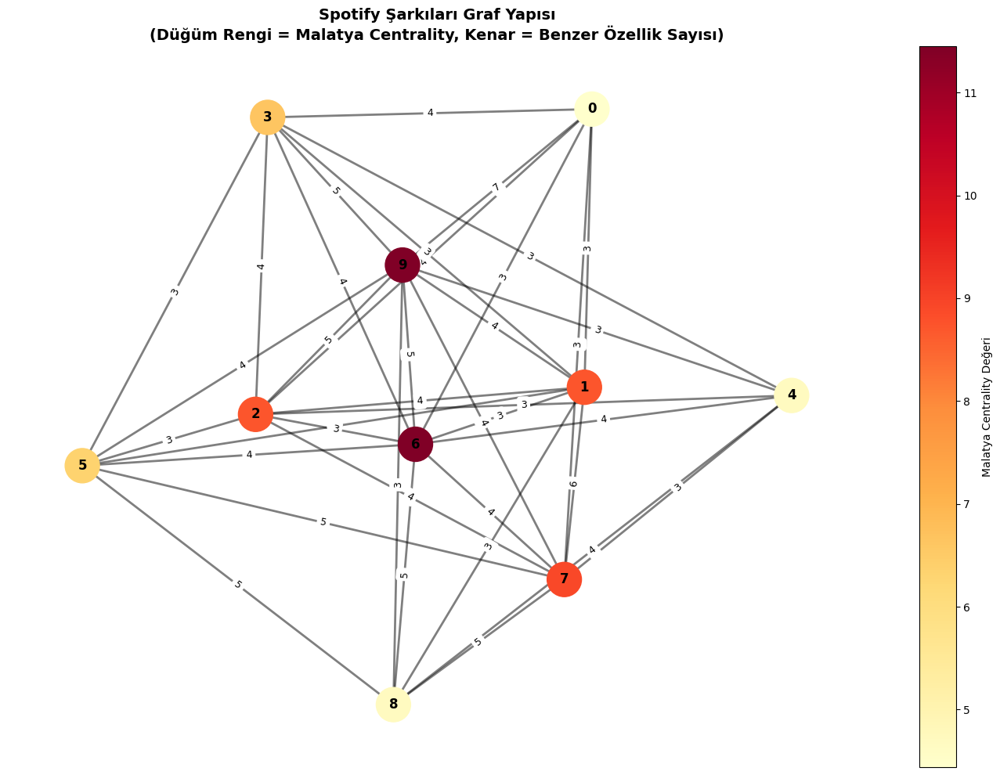


📋 DETAYLI SONUÇ TABLOSU:
 Düğüm Malatya_Centrality  Derece               Sanatçı                          Şarkı
     0             4.4405       6            Jason Mraz                I Won't Give Up
     1             8.7302       8            Jason Mraz               93 Million Miles
     2             8.7302       8         Joshua Hyslop               Do Not Let Me Go
     3             6.6389       7          Boyce Avenue                       Fast Car
     4             4.6905       6          Andrew Belle               Sky's Still Blue
     5             6.3472       7         Chris Smither                  What They Say
     6            11.4464       9            Matt Wertz Walking in a Winter Wonderland
     7             8.9206       8 Green River Ordinance                  Dancing Shoes
     8             4.6905       6            Jason Mraz           Living in the Moment
     9            11.4464       9          Boyce Avenue                         Heaven


In [16]:
# ============================================
# BU KODU YENİ HÜCREDEKİ ÇALIŞTIRIN
# ============================================

# İlk 10 şarkıyı al
df_ilk10 = df.head(10).reset_index(drop=True)

# Kategorize et
df_kategorik = veri_kategorize(df_ilk10)

# Graf oluştur (en az 3 benzer özellik gerekli)
G = graf_olustur(df_kategorik, esik=3)

# Graf bilgilerini göster
print(f"\n📊 Graf Bilgileri:")
print(f"   Düğüm Sayısı: {G.number_of_nodes()}")
print(f"   Kenar Sayısı: {G.number_of_edges()}")

# Malatya Centrality hesapla
malatya_values = malatya_centrality(G)

# Sonuçları göster
print(f"\n🎵 İLK 10 ŞARKI MALATYA CENTRALITY DEĞERLERİ:")
print("-" * 70)
for node in sorted(malatya_values.keys()):
    value = malatya_values[node]
    track = df_ilk10.loc[node, 'track_name']
    artist = df_ilk10.loc[node, 'artist_name']
    degree = G.degree(node)
    print(f"Düğüm {node}: {value:.4f} (Derece: {degree}) - {artist} - {track}")

# En yüksek Malatya Centrality
max_node = max(malatya_values.items(), key=lambda x: x[1])
print(f"\n🏆 EN YÜKSEK MALATYA CENTRALITY:")
print(f"   Düğüm: {max_node[0]}")
print(f"   Değer: {max_node[1]:.4f}")
print(f"   Şarkı: {df_ilk10.loc[max_node[0], 'artist_name']} - {df_ilk10.loc[max_node[0], 'track_name']}")

# Graf görselleştirme
fig, ax = plt.subplots(figsize=(14, 10))
pos = nx.spring_layout(G, k=2, iterations=50, seed=42)

# Düğüm renkleri
node_colors = [malatya_values[node] for node in G.nodes()]

# Düğümleri çiz
if len(node_colors) > 0:
    nodes = nx.draw_networkx_nodes(G, pos, node_color=node_colors,
                           node_size=1000, cmap='YlOrRd',
                           vmin=min(node_colors),
                           vmax=max(node_colors), ax=ax)
else:
    nx.draw_networkx_nodes(G, pos, node_size=1000, ax=ax)

# Etiketleri çiz
nx.draw_networkx_labels(G, pos, font_size=12, font_weight='bold', ax=ax)

# Kenarları çiz
nx.draw_networkx_edges(G, pos, alpha=0.5, width=2, ax=ax)

# Kenar ağırlıklarını göster
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels, font_size=9, ax=ax)

ax.set_title('Spotify Şarkıları Graf Yapısı\n(Düğüm Rengi = Malatya Centrality, Kenar = Benzer Özellik Sayısı)',
         fontsize=14, fontweight='bold')

if len(node_colors) > 0:
    plt.colorbar(nodes, ax=ax, label='Malatya Centrality Değeri')

ax.axis('off')
plt.tight_layout()
plt.show()

# Detaylı tablo
results_df = pd.DataFrame({
    'Düğüm': list(malatya_values.keys()),
    'Malatya_Centrality': [f"{v:.4f}" for v in malatya_values.values()],
    'Derece': [G.degree(node) for node in malatya_values.keys()],
    'Sanatçı': [df_ilk10.loc[i, 'artist_name'] for i in malatya_values.keys()],
    'Şarkı': [df_ilk10.loc[i, 'track_name'] for i in malatya_values.keys()]
})

results_df = results_df.sort_values('Düğüm')
print(f"\n📋 DETAYLI SONUÇ TABLOSU:")
print(results_df.to_string(index=False))

SPOTIFY MALATYA CENTRALITY - ÇOKLU ANALİZ

Analiz Boyutları: [10, 20, 50, 100, 200]


📊 ANALİZ: İLK 10 ŞARKI
✓ 10 şarkı alındı
✓ Özellikler kategorize edildi
✓ Graf oluşturuldu
  - Düğüm Sayısı: 10
  - Kenar Sayısı: 37
  - Ortalama Derece: 7.40
✓ Malatya Centrality hesaplandı

🏆 EN YÜKSEK MALATYA CENTRALITY:
  Düğüm: 6
  Değer: 11.4464
  Derece: 9
  Şarkı: Matt Wertz - Walking in a Winter Wonderland

📈 İLK 5 EN YÜKSEK DEĞER:
  1. Düğüm 6: 11.4464 (Derece: 9) - Matt Wertz - Walking in a Winter Wonderland
  2. Düğüm 9: 11.4464 (Derece: 9) - Boyce Avenue - Heaven
  3. Düğüm 7: 8.9206 (Derece: 8) - Green River Ordinance - Dancing Shoes
  4. Düğüm 2: 8.7302 (Derece: 8) - Joshua Hyslop - Do Not Let Me Go
  5. Düğüm 1: 8.7302 (Derece: 8) - Jason Mraz - 93 Million Miles

📊 İSTATİSTİKLER:
  Minimum: 4.4405
  Maksimum: 11.4464
  Ortalama: 7.6081
  Medyan: 7.6845
  Std. Sapma: 2.5158

⏱️ Süre: 0.02 saniye

🎨 Graf görselleştiriliyor...
✓ Graf kaydedildi: graf_ilk_10.png


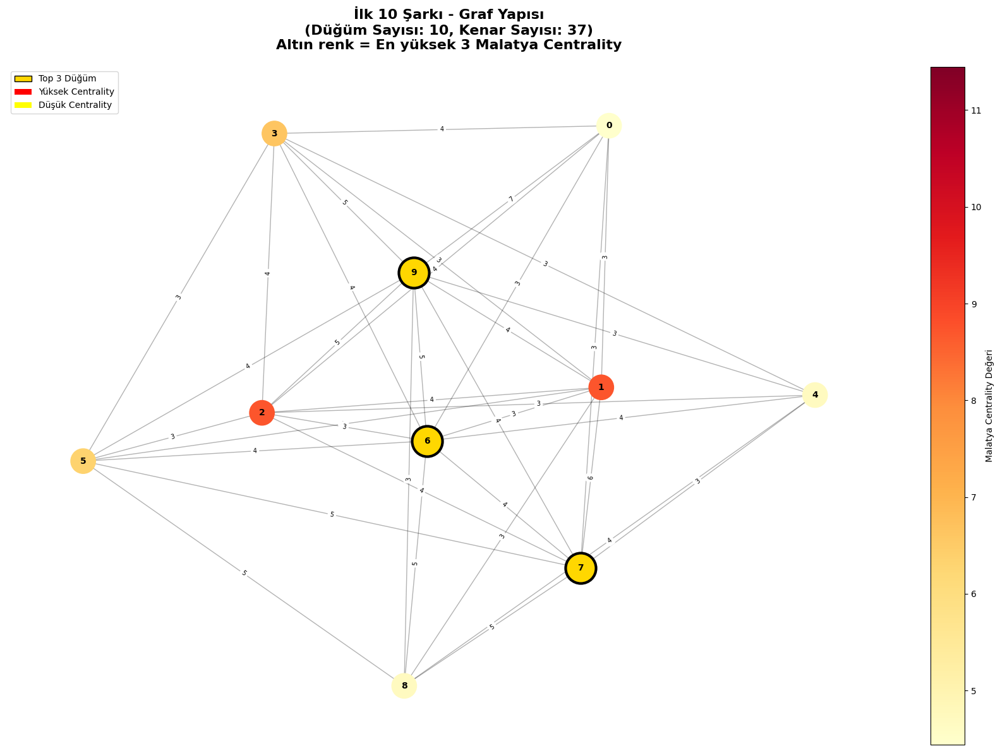


📊 ANALİZ: İLK 20 ŞARKI
✓ 20 şarkı alındı
✓ Özellikler kategorize edildi
✓ Graf oluşturuldu
  - Düğüm Sayısı: 20
  - Kenar Sayısı: 168
  - Ortalama Derece: 16.80
✓ Malatya Centrality hesaplandı

🏆 EN YÜKSEK MALATYA CENTRALITY:
  Düğüm: 5
  Değer: 21.8458
  Derece: 19
  Şarkı: Chris Smither - What They Say

📈 İLK 5 EN YÜKSEK DEĞER:
  1. Düğüm 5: 21.8458 (Derece: 19) - Chris Smither - What They Say
  2. Düğüm 16: 21.8458 (Derece: 19) - Gabrielle Aplin - Home
  3. Düğüm 7: 19.4434 (Derece: 18) - Green River Ordinance - Dancing Shoes
  4. Düğüm 10: 19.2588 (Derece: 18) - Tristan Prettyman - Say Anything
  5. Düğüm 12: 19.2588 (Derece: 18) - Boyce Avenue - Someone Like You

📊 İSTATİSTİKLER:
  Minimum: 9.7547
  Maksimum: 21.8458
  Ortalama: 16.9600
  Medyan: 17.3076
  Std. Sapma: 3.1158

⏱️ Süre: 0.07 saniye

🎨 Graf görselleştiriliyor...
✓ Graf kaydedildi: graf_ilk_20.png


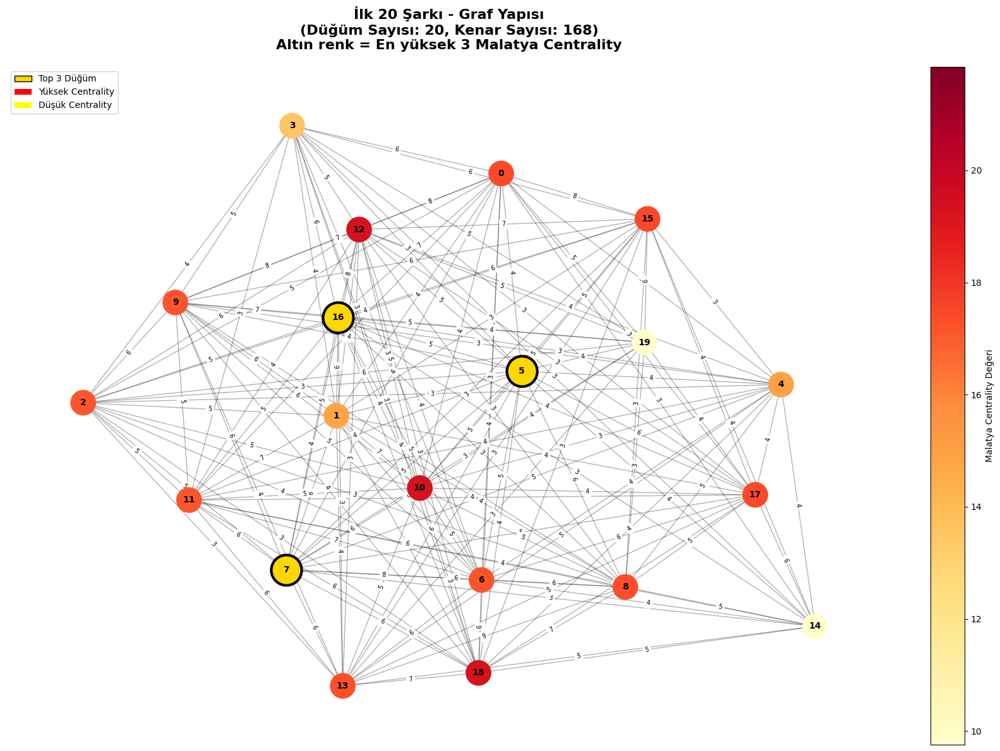


📊 ANALİZ: İLK 50 ŞARKI
✓ 50 şarkı alındı
✓ Özellikler kategorize edildi
✓ Graf oluşturuldu
  - Düğüm Sayısı: 50
  - Kenar Sayısı: 1207
  - Ortalama Derece: 48.28
✓ Malatya Centrality hesaplandı

🏆 EN YÜKSEK MALATYA CENTRALITY:
  Düğüm: 0
  Değer: 49.7940
  Derece: 49
  Şarkı: Jason Mraz - I Won't Give Up

📈 İLK 5 EN YÜKSEK DEĞER:
  1. Düğüm 0: 49.7940 (Derece: 49) - Jason Mraz - I Won't Give Up
  2. Düğüm 1: 49.7940 (Derece: 49) - Jason Mraz - 93 Million Miles
  3. Düğüm 3: 49.7940 (Derece: 49) - Boyce Avenue - Fast Car
  4. Düğüm 5: 49.7940 (Derece: 49) - Chris Smither - What They Say
  5. Düğüm 6: 49.7940 (Derece: 49) - Matt Wertz - Walking in a Winter Wonderland

📊 İSTATİSTİKLER:
  Minimum: 36.1995
  Maksimum: 49.7940
  Ortalama: 48.3253
  Medyan: 49.7940
  Std. Sapma: 2.8432

⏱️ Süre: 0.37 saniye

🎨 Graf görselleştiriliyor...
✓ Graf kaydedildi: graf_ilk_50.png


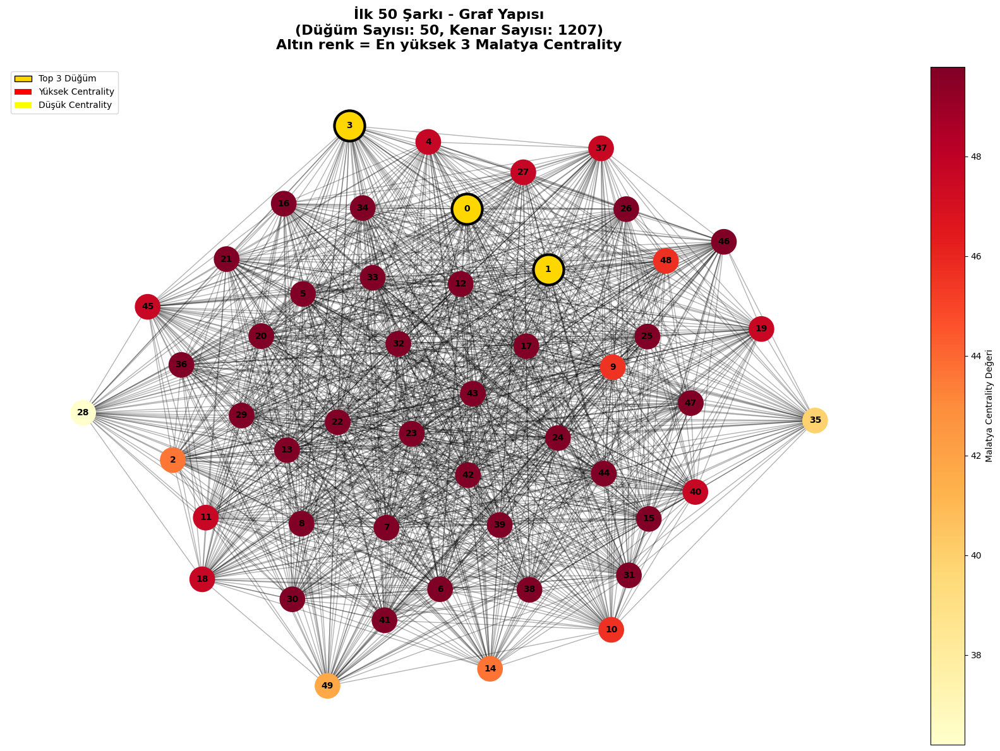


📊 ANALİZ: İLK 100 ŞARKI
✓ 100 şarkı alındı
✓ Özellikler kategorize edildi
✓ Graf oluşturuldu
  - Düğüm Sayısı: 100
  - Kenar Sayısı: 4821
  - Ortalama Derece: 96.42
✓ Malatya Centrality hesaplandı

🏆 EN YÜKSEK MALATYA CENTRALITY:
  Düğüm: 5
  Değer: 101.8845
  Derece: 99
  Şarkı: Chris Smither - What They Say

📈 İLK 5 EN YÜKSEK DEĞER:
  1. Düğüm 5: 101.8845 (Derece: 99) - Chris Smither - What They Say
  2. Düğüm 6: 101.8845 (Derece: 99) - Matt Wertz - Walking in a Winter Wonderland
  3. Düğüm 13: 101.8845 (Derece: 99) - Jason Mraz - The Woman I Love
  4. Düğüm 17: 101.8845 (Derece: 99) - Harley Poe - Transvestities Can Be Cannibals Too
  5. Düğüm 21: 101.8845 (Derece: 99) - Jason Mraz - Winter Wonderland

📊 İSTATİSTİKLER:
  Minimum: 57.8733
  Maksimum: 101.8845
  Ortalama: 96.5991
  Medyan: 99.5386
  Std. Sapma: 7.8294

⏱️ Süre: 1.05 saniye

🎨 Graf görselleştiriliyor...
✓ Graf kaydedildi: graf_ilk_100.png


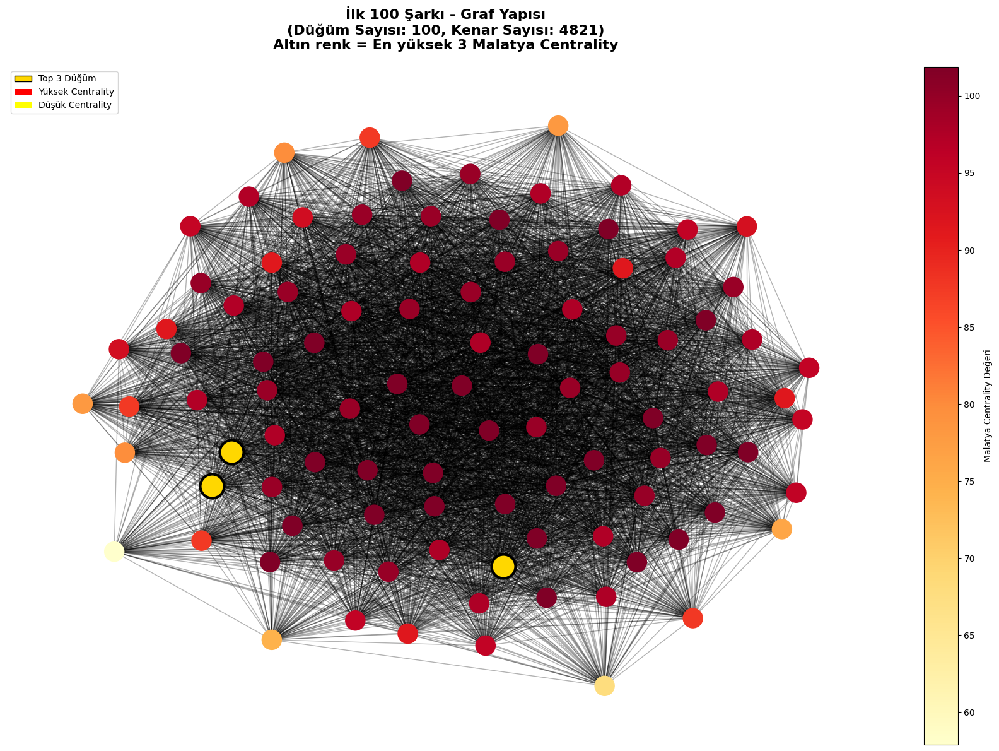


📊 ANALİZ: İLK 200 ŞARKI
✓ 200 şarkı alındı
✓ Özellikler kategorize edildi
✓ Graf oluşturuldu
  - Düğüm Sayısı: 200
  - Kenar Sayısı: 19186
  - Ortalama Derece: 191.86
✓ Malatya Centrality hesaplandı

🏆 EN YÜKSEK MALATYA CENTRALITY:
  Düğüm: 21
  Değer: 207.3223
  Derece: 199
  Şarkı: Jason Mraz - Winter Wonderland

📈 İLK 5 EN YÜKSEK DEĞER:
  1. Düğüm 21: 207.3223 (Derece: 199) - Jason Mraz - Winter Wonderland
  2. Düğüm 42: 207.3223 (Derece: 199) - Boyce Avenue - What Makes You Beautiful
  3. Düğüm 50: 207.3223 (Derece: 199) - David Ramirez - Find the Light
  4. Düğüm 63: 207.3223 (Derece: 199) - Sara Bareilles - Beautiful Girl
  5. Düğüm 66: 207.3223 (Derece: 199) - Boyce Avenue - Here Without You

📊 İSTATİSTİKLER:
  Minimum: 65.4186
  Maksimum: 207.3223
  Ortalama: 192.4813
  Medyan: 199.5600
  Std. Sapma: 19.5522

⏱️ Süre: 4.97 saniye

🎨 Graf görselleştiriliyor...
✓ Graf kaydedildi: graf_ilk_200.png


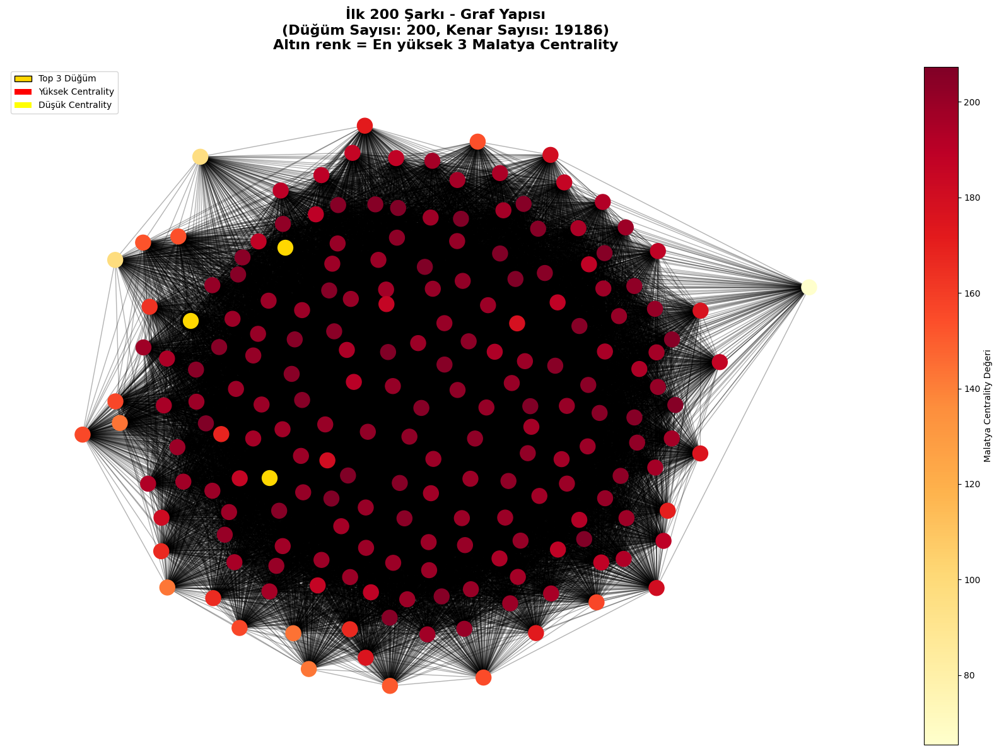


📋 KARŞILAŞTIRMALI ÖZET TABLO
 Boyut  Max_Düğüm Max_Centrality  Max_Derece  Kenar_Sayısı Ort_Derece Ort_Centrality       Sanatçı                          Şarkı
    10          6        11.4464           9            37       7.40         7.6081    Matt Wertz Walking in a Winter Wonderland
    20          5        21.8458          19           168      16.80        16.9600 Chris Smither                  What They Say
    50          0        49.7940          49          1207      48.28        48.3253    Jason Mraz                I Won't Give Up
   100          5       101.8845          99          4821      96.42        96.5991 Chris Smither                  What They Say
   200         21       207.3223         199         19186     191.86       192.4813    Jason Mraz              Winter Wonderland

📊 GÖRSELLEŞTİRMELER OLUŞTURULUYOR...

🎨 Tüm graflar birlikte görselleştiriliyor...
✓ Özet grafik kaydedildi: tum_graflar_ozet.png


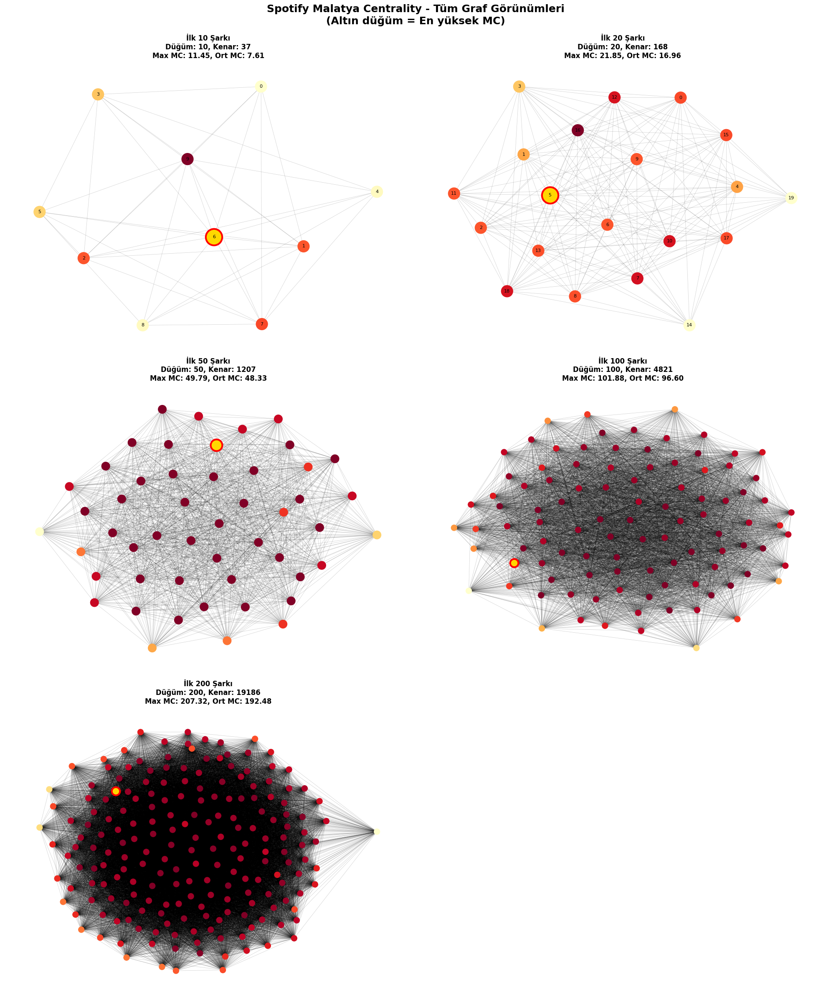

✓ Grafikler kaydedildi: malatya_analiz_grafikleri.png


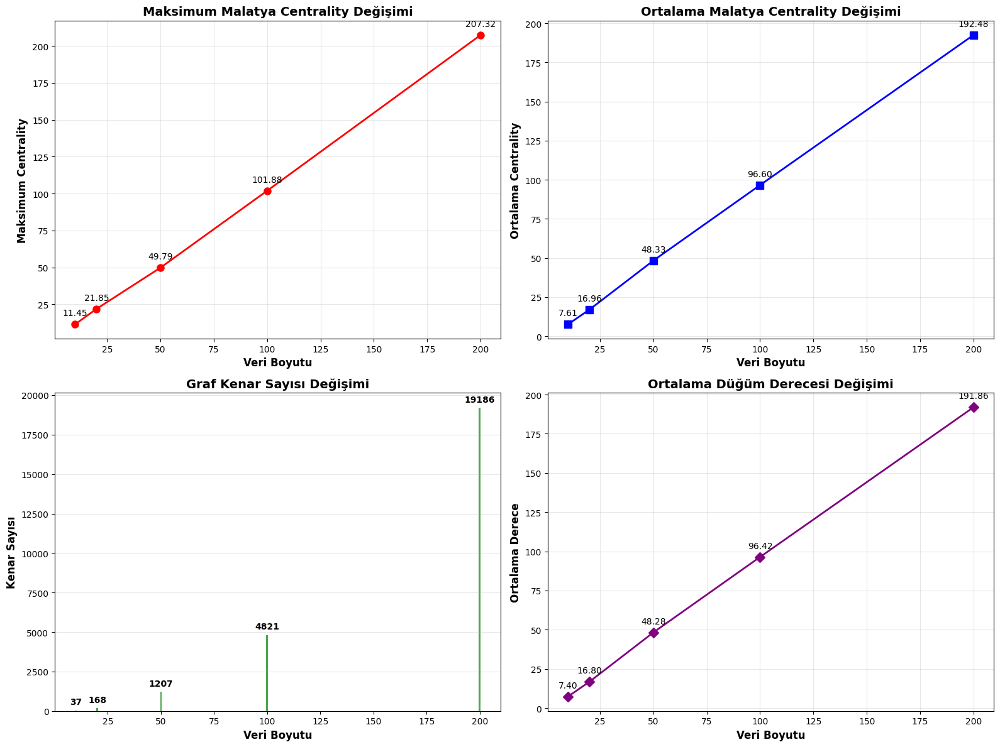


📄 EXCEL RAPORU OLUŞTURULUYOR...
✓ Excel raporu oluşturuldu: malatya_centrality_rapor.xlsx

✅ TÜM ANALİZLER TAMAMLANDI!


In [18]:
# ============================================
# ÇOKLU ANALİZ: 10, 20, 50, 100, 200 ŞARKI
# ============================================

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import time

# Analiz yapılacak boyutlar
BOYUTLAR = [10, 20, 50, 100, 200]

# Tüm sonuçları saklamak için
tum_sonuclar = {}

print("=" * 80)
print("SPOTIFY MALATYA CENTRALITY - ÇOKLU ANALİZ")
print("=" * 80)
print(f"\nAnaliz Boyutları: {BOYUTLAR}")
print("\n" + "=" * 80)

# Her boyut için analiz yap
for boyut in BOYUTLAR:
    print(f"\n{'='*80}")
    print(f"📊 ANALİZ: İLK {boyut} ŞARKI")
    print(f"{'='*80}")

    baslangic = time.time()

    # 1. Veriyi al
    df_subset = df.head(boyut).reset_index(drop=True)
    print(f"✓ {boyut} şarkı alındı")

    # 2. Kategorize et
    df_kategorik = veri_kategorize(df_subset)
    print(f"✓ Özellikler kategorize edildi")

    # 3. Graf oluştur
    G = graf_olustur(df_kategorik, esik=3)
    print(f"✓ Graf oluşturuldu")
    print(f"  - Düğüm Sayısı: {G.number_of_nodes()}")
    print(f"  - Kenar Sayısı: {G.number_of_edges()}")
    print(f"  - Ortalama Derece: {2*G.number_of_edges()/G.number_of_nodes():.2f}")

    # 4. Malatya Centrality hesapla
    malatya_values = malatya_centrality(G)
    print(f"✓ Malatya Centrality hesaplandı")

    # 5. En yüksek değerleri bul
    if len(malatya_values) > 0:
        sorted_nodes = sorted(malatya_values.items(), key=lambda x: x[1], reverse=True)
        max_node = sorted_nodes[0]

        print(f"\n🏆 EN YÜKSEK MALATYA CENTRALITY:")
        print(f"  Düğüm: {max_node[0]}")
        print(f"  Değer: {max_node[1]:.4f}")
        print(f"  Derece: {G.degree(max_node[0])}")
        print(f"  Şarkı: {df_subset.loc[max_node[0], 'artist_name']} - {df_subset.loc[max_node[0], 'track_name']}")

        # İlk 5'i göster
        print(f"\n📈 İLK 5 EN YÜKSEK DEĞER:")
        for i, (node, value) in enumerate(sorted_nodes[:5], 1):
            artist = df_subset.loc[node, 'artist_name']
            track = df_subset.loc[node, 'track_name']
            degree = G.degree(node)
            print(f"  {i}. Düğüm {node}: {value:.4f} (Derece: {degree}) - {artist} - {track}")

        # İstatistikler
        values_list = list(malatya_values.values())
        print(f"\n📊 İSTATİSTİKLER:")
        print(f"  Minimum: {min(values_list):.4f}")
        print(f"  Maksimum: {max(values_list):.4f}")
        print(f"  Ortalama: {np.mean(values_list):.4f}")
        print(f"  Medyan: {np.median(values_list):.4f}")
        print(f"  Std. Sapma: {np.std(values_list):.4f}")

        # Sonuçları sakla
        tum_sonuclar[boyut] = {
            'max_node': max_node[0],
            'max_value': max_node[1],
            'max_degree': G.degree(max_node[0]),
            'max_artist': df_subset.loc[max_node[0], 'artist_name'],
            'max_track': df_subset.loc[max_node[0], 'track_name'],
            'num_nodes': G.number_of_nodes(),
            'num_edges': G.number_of_edges(),
            'avg_degree': 2*G.number_of_edges()/G.number_of_nodes() if G.number_of_nodes() > 0 else 0,
            'min_centrality': min(values_list),
            'max_centrality': max(values_list),
            'avg_centrality': np.mean(values_list),
            'median_centrality': np.median(values_list),
            'std_centrality': np.std(values_list),
            'all_values': malatya_values
        }
    else:
        print("⚠️ Graf bağlantısız, Malatya Centrality hesaplanamadı!")
        tum_sonuclar[boyut] = None

    bitis = time.time()
    print(f"\n⏱️ Süre: {bitis - baslangic:.2f} saniye")

    # ============================================
    # GRAF GÖRSELLEŞTİRME
    # ============================================

    print(f"\n🎨 Graf görselleştiriliyor...")

    fig, ax = plt.subplots(figsize=(16, 12))

    # Layout hesapla
    if boyut <= 50:
        pos = nx.spring_layout(G, k=2, iterations=50, seed=42)
        node_size = 800
        font_size = 10
    elif boyut <= 100:
        pos = nx.spring_layout(G, k=1.5, iterations=50, seed=42)
        node_size = 500
        font_size = 8
    else:
        pos = nx.spring_layout(G, k=1, iterations=50, seed=42)
        node_size = 300
        font_size = 6

    # Düğüm renkleri (Malatya Centrality'ye göre)
    node_colors = [malatya_values.get(node, 0) for node in G.nodes()]

    # Düğümleri çiz
    if len(node_colors) > 0:
        nodes = nx.draw_networkx_nodes(G, pos, node_color=node_colors,
                               node_size=node_size, cmap='YlOrRd',
                               vmin=min(node_colors),
                               vmax=max(node_colors), ax=ax)

        # En yüksek 3 düğümü vurgula
        sorted_nodes = sorted(malatya_values.items(), key=lambda x: x[1], reverse=True)[:3]
        top_nodes = [n[0] for n in sorted_nodes]
        top_pos = {k: v for k, v in pos.items() if k in top_nodes}
        nx.draw_networkx_nodes(G, top_pos, nodelist=top_nodes,
                               node_color='gold', node_size=node_size*1.5,
                               edgecolors='black', linewidths=3, ax=ax)

    # Etiketleri çiz (sadece küçük graflarda)
    if boyut <= 50:
        nx.draw_networkx_labels(G, pos, font_size=font_size, font_weight='bold', ax=ax)

    # Kenarları çiz
    nx.draw_networkx_edges(G, pos, alpha=0.3, width=1, ax=ax)

    # Kenar ağırlıklarını göster (sadece çok küçük graflarda)
    if boyut <= 20:
        edge_labels = nx.get_edge_attributes(G, 'weight')
        nx.draw_networkx_edge_labels(G, pos, edge_labels, font_size=7, ax=ax)

    ax.set_title(f'İlk {boyut} Şarkı - Graf Yapısı\n' +
                 f'(Düğüm Sayısı: {G.number_of_nodes()}, Kenar Sayısı: {G.number_of_edges()})\n' +
                 f'Altın renk = En yüksek 3 Malatya Centrality',
                 fontsize=16, fontweight='bold', pad=20)

    # Colorbar ekle
    if len(node_colors) > 0:
        cbar = plt.colorbar(nodes, ax=ax, label='Malatya Centrality Değeri', fraction=0.046, pad=0.04)
        cbar.ax.tick_params(labelsize=10)

    # Legend ekle
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='gold', edgecolor='black', label='Top 3 Düğüm'),
        Patch(facecolor='red', label='Yüksek Centrality'),
        Patch(facecolor='yellow', label='Düşük Centrality')
    ]
    ax.legend(handles=legend_elements, loc='upper left', fontsize=10)

    ax.axis('off')
    plt.tight_layout()

    # Kaydet
    dosya_adi = f'graf_ilk_{boyut}.png'
    plt.savefig(dosya_adi, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Graf kaydedildi: {dosya_adi}")
    plt.show()
    plt.close()

# ============================================
# KARŞILAŞTIRMALI ÖZET TABLO
# ============================================

print("\n" + "=" * 80)
print("📋 KARŞILAŞTIRMALI ÖZET TABLO")
print("=" * 80)

ozet_data = []
for boyut in BOYUTLAR:
    if tum_sonuclar[boyut] is not None:
        sonuc = tum_sonuclar[boyut]
        ozet_data.append({
            'Boyut': boyut,
            'Max_Düğüm': sonuc['max_node'],
            'Max_Centrality': f"{sonuc['max_centrality']:.4f}",
            'Max_Derece': sonuc['max_degree'],
            'Kenar_Sayısı': sonuc['num_edges'],
            'Ort_Derece': f"{sonuc['avg_degree']:.2f}",
            'Ort_Centrality': f"{sonuc['avg_centrality']:.4f}",
            'Sanatçı': sonuc['max_artist'],
            'Şarkı': sonuc['max_track'][:30] + '...' if len(sonuc['max_track']) > 30 else sonuc['max_track']
        })

ozet_df = pd.DataFrame(ozet_data)
print(ozet_df.to_string(index=False))

# ============================================
# GÖRSELLEŞTİRMELER
# ============================================

print("\n" + "=" * 80)
print("📊 GÖRSELLEŞTİRMELER OLUŞTURULUYOR...")
print("=" * 80)

# ============================================
# TÜM GRAFLARI BİRLİKTE GÖSTER (2x3 LAYOUT)
# ============================================

print("\n🎨 Tüm graflar birlikte görselleştiriliyor...")

fig = plt.figure(figsize=(20, 24))

for idx, boyut in enumerate(BOYUTLAR, 1):
    if tum_sonuclar[boyut] is not None:
        ax = plt.subplot(3, 2, idx)

        # Graf bilgilerini al
        df_subset = df.head(boyut).reset_index(drop=True)
        df_kategorik = veri_kategorize(df_subset)
        G = graf_olustur(df_kategorik, esik=3)
        malatya_values = tum_sonuclar[boyut]['all_values']

        # Layout
        if boyut <= 20:
            pos = nx.spring_layout(G, k=2.5, iterations=50, seed=42)
            node_size = 400
            font_size = 8
            show_labels = True
        elif boyut <= 50:
            pos = nx.spring_layout(G, k=2, iterations=50, seed=42)
            node_size = 200
            font_size = 6
            show_labels = False
        else:
            pos = nx.spring_layout(G, k=1.5, iterations=50, seed=42)
            node_size = 100
            font_size = 4
            show_labels = False

        # Renklendirme
        node_colors = [malatya_values.get(node, 0) for node in G.nodes()]

        if len(node_colors) > 0:
            # Düğümleri çiz
            nx.draw_networkx_nodes(G, pos, node_color=node_colors,
                                   node_size=node_size, cmap='YlOrRd',
                                   vmin=min(node_colors),
                                   vmax=max(node_colors), ax=ax)

            # En yüksek düğümü vurgula
            max_node = max(malatya_values.items(), key=lambda x: x[1])[0]
            nx.draw_networkx_nodes(G, pos, nodelist=[max_node],
                                   node_color='gold', node_size=node_size*2,
                                   edgecolors='red', linewidths=3, ax=ax)

        # Etiketler
        if show_labels:
            nx.draw_networkx_labels(G, pos, font_size=font_size, ax=ax)

        # Kenarlar
        nx.draw_networkx_edges(G, pos, alpha=0.2, width=0.5, ax=ax)

        # Başlık
        max_cent = tum_sonuclar[boyut]['max_centrality']
        avg_cent = tum_sonuclar[boyut]['avg_centrality']
        ax.set_title(f'İlk {boyut} Şarkı\n' +
                     f'Düğüm: {G.number_of_nodes()}, Kenar: {G.number_of_edges()}\n' +
                     f'Max MC: {max_cent:.2f}, Ort MC: {avg_cent:.2f}',
                     fontsize=12, fontweight='bold')
        ax.axis('off')

plt.suptitle('Spotify Malatya Centrality - Tüm Graf Görünümleri\n(Altın düğüm = En yüksek MC)',
             fontsize=18, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('tum_graflar_ozet.png', dpi=300, bbox_inches='tight', facecolor='white')
print("✓ Özet grafik kaydedildi: tum_graflar_ozet.png")
plt.show()
plt.close()

# ============================================
# İSTATİSTİK GRAFİKLERİ
# ============================================

# 1. Maksimum Centrality Değişimi
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Grafik 1: Max Centrality vs Boyut
ax1 = axes[0, 0]
boyutlar_list = [b for b in BOYUTLAR if tum_sonuclar[b] is not None]
max_centralities = [tum_sonuclar[b]['max_centrality'] for b in boyutlar_list]
ax1.plot(boyutlar_list, max_centralities, marker='o', linewidth=2, markersize=8, color='red')
ax1.set_xlabel('Veri Boyutu', fontsize=12, fontweight='bold')
ax1.set_ylabel('Maksimum Centrality', fontsize=12, fontweight='bold')
ax1.set_title('Maksimum Malatya Centrality Değişimi', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)
for i, (x, y) in enumerate(zip(boyutlar_list, max_centralities)):
    ax1.annotate(f'{y:.2f}', (x, y), textcoords="offset points", xytext=(0,10), ha='center')

# Grafik 2: Ortalama Centrality vs Boyut
ax2 = axes[0, 1]
avg_centralities = [tum_sonuclar[b]['avg_centrality'] for b in boyutlar_list]
ax2.plot(boyutlar_list, avg_centralities, marker='s', linewidth=2, markersize=8, color='blue')
ax2.set_xlabel('Veri Boyutu', fontsize=12, fontweight='bold')
ax2.set_ylabel('Ortalama Centrality', fontsize=12, fontweight='bold')
ax2.set_title('Ortalama Malatya Centrality Değişimi', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)
for i, (x, y) in enumerate(zip(boyutlar_list, avg_centralities)):
    ax2.annotate(f'{y:.2f}', (x, y), textcoords="offset points", xytext=(0,10), ha='center')

# Grafik 3: Kenar Sayısı vs Boyut
ax3 = axes[1, 0]
edge_counts = [tum_sonuclar[b]['num_edges'] for b in boyutlar_list]
ax3.bar(boyutlar_list, edge_counts, color='green', alpha=0.7)
ax3.set_xlabel('Veri Boyutu', fontsize=12, fontweight='bold')
ax3.set_ylabel('Kenar Sayısı', fontsize=12, fontweight='bold')
ax3.set_title('Graf Kenar Sayısı Değişimi', fontsize=14, fontweight='bold')
ax3.grid(True, alpha=0.3, axis='y')
for i, (x, y) in enumerate(zip(boyutlar_list, edge_counts)):
    ax3.text(x, y + max(edge_counts)*0.02, str(y), ha='center', fontweight='bold')

# Grafik 4: Ortalama Derece vs Boyut
ax4 = axes[1, 1]
avg_degrees = [tum_sonuclar[b]['avg_degree'] for b in boyutlar_list]
ax4.plot(boyutlar_list, avg_degrees, marker='D', linewidth=2, markersize=8, color='purple')
ax4.set_xlabel('Veri Boyutu', fontsize=12, fontweight='bold')
ax4.set_ylabel('Ortalama Derece', fontsize=12, fontweight='bold')
ax4.set_title('Ortalama Düğüm Derecesi Değişimi', fontsize=14, fontweight='bold')
ax4.grid(True, alpha=0.3)
for i, (x, y) in enumerate(zip(boyutlar_list, avg_degrees)):
    ax4.annotate(f'{y:.2f}', (x, y), textcoords="offset points", xytext=(0,10), ha='center')

plt.tight_layout()
plt.savefig('malatya_analiz_grafikleri.png', dpi=300, bbox_inches='tight')
print("✓ Grafikler kaydedildi: malatya_analiz_grafikleri.png")
plt.show()

# ============================================
# DETAYLI EXCEL RAPORU OLUŞTUR
# ============================================

print("\n" + "=" * 80)
print("📄 EXCEL RAPORU OLUŞTURULUYOR...")
print("=" * 80)

try:
    with pd.ExcelWriter('malatya_centrality_rapor.xlsx', engine='openpyxl') as writer:
        # Sayfa 1: Özet
        ozet_df.to_excel(writer, sheet_name='Özet', index=False)

        # Her boyut için ayrı sayfa
        for boyut in BOYUTLAR:
            if tum_sonuclar[boyut] is not None:
                sonuc = tum_sonuclar[boyut]
                df_subset = df.head(boyut).reset_index(drop=True)

                # Detaylı sonuçlar
                detay_data = []
                for node, value in sorted(sonuc['all_values'].items(), key=lambda x: x[1], reverse=True):
                    detay_data.append({
                        'Düğüm': node,
                        'Malatya_Centrality': f"{value:.4f}",
                        'Derece': G.degree(node),
                        'Sanatçı': df_subset.loc[node, 'artist_name'],
                        'Şarkı': df_subset.loc[node, 'track_name'],
                        'Tür': df_subset.loc[node, 'genre']
                    })

                detay_df = pd.DataFrame(detay_data)
                detay_df.to_excel(writer, sheet_name=f'İlk_{boyut}', index=False)

        print("✓ Excel raporu oluşturuldu: malatya_centrality_rapor.xlsx")
except Exception as e:
    print(f"⚠️ Excel oluşturulamadı: {e}")

print("\n" + "=" * 80)
print("✅ TÜM ANALİZLER TAMAMLANDI!")
print("=" * 80)

SPOTIFY MALATYA CENTRALITY - ÇOKLU ANALİZ

Analiz Boyutları: [10, 20, 50, 100, 200]


📊 ANALİZ: İLK 10 ŞARKI
✓ 10 şarkı alındı
✓ Özellikler kategorize edildi
✓ Graf oluşturuldu
  - Düğüm Sayısı: 10
  - Kenar Sayısı: 37
  - Ortalama Derece: 7.40
✓ Malatya Centrality hesaplandı

🏆 EN YÜKSEK MALATYA CENTRALITY:
  Düğüm: 6
  Değer: 11.4464
  Derece: 9
  Şarkı: Matt Wertz - Walking in a Winter Wonderland

📈 İLK 5 EN YÜKSEK DEĞER:
  1. Düğüm 6: 11.4464 (Derece: 9) - Matt Wertz - Walking in a Winter Wonderland
  2. Düğüm 9: 11.4464 (Derece: 9) - Boyce Avenue - Heaven
  3. Düğüm 7: 8.9206 (Derece: 8) - Green River Ordinance - Dancing Shoes
  4. Düğüm 2: 8.7302 (Derece: 8) - Joshua Hyslop - Do Not Let Me Go
  5. Düğüm 1: 8.7302 (Derece: 8) - Jason Mraz - 93 Million Miles

📊 İSTATİSTİKLER:
  Minimum: 4.4405
  Maksimum: 11.4464
  Ortalama: 7.6081
  Medyan: 7.6845
  Std. Sapma: 2.5158

⏱️ Süre: 0.06 saniye

🎨 Graf görselleştiriliyor...
  ✓ 37 kenar ağırlığı yazıldı
✓ Graf kaydedildi: graf_ilk_10.p

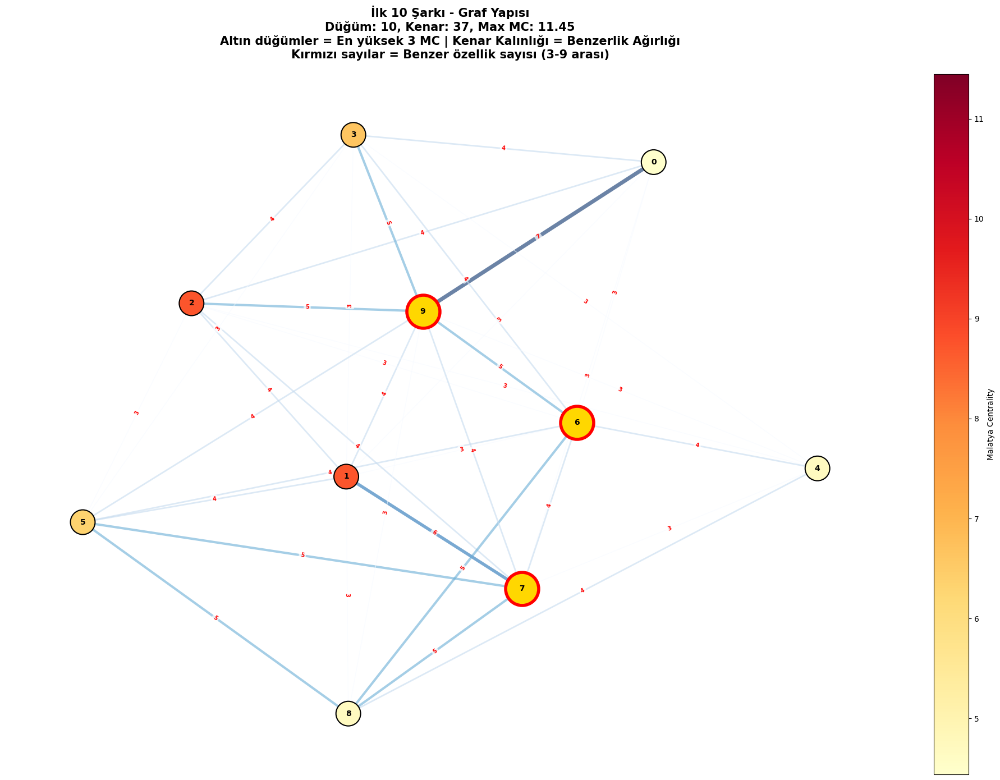


📊 ANALİZ: İLK 20 ŞARKI
✓ 20 şarkı alındı
✓ Özellikler kategorize edildi
✓ Graf oluşturuldu
  - Düğüm Sayısı: 20
  - Kenar Sayısı: 168
  - Ortalama Derece: 16.80
✓ Malatya Centrality hesaplandı

🏆 EN YÜKSEK MALATYA CENTRALITY:
  Düğüm: 5
  Değer: 21.8458
  Derece: 19
  Şarkı: Chris Smither - What They Say

📈 İLK 5 EN YÜKSEK DEĞER:
  1. Düğüm 5: 21.8458 (Derece: 19) - Chris Smither - What They Say
  2. Düğüm 16: 21.8458 (Derece: 19) - Gabrielle Aplin - Home
  3. Düğüm 7: 19.4434 (Derece: 18) - Green River Ordinance - Dancing Shoes
  4. Düğüm 10: 19.2588 (Derece: 18) - Tristan Prettyman - Say Anything
  5. Düğüm 12: 19.2588 (Derece: 18) - Boyce Avenue - Someone Like You

📊 İSTATİSTİKLER:
  Minimum: 9.7547
  Maksimum: 21.8458
  Ortalama: 16.9600
  Medyan: 17.3076
  Std. Sapma: 3.1158

⏱️ Süre: 0.04 saniye

🎨 Graf görselleştiriliyor...
  ✓ 168 kenar ağırlığı yazıldı
✓ Graf kaydedildi: graf_ilk_20.png


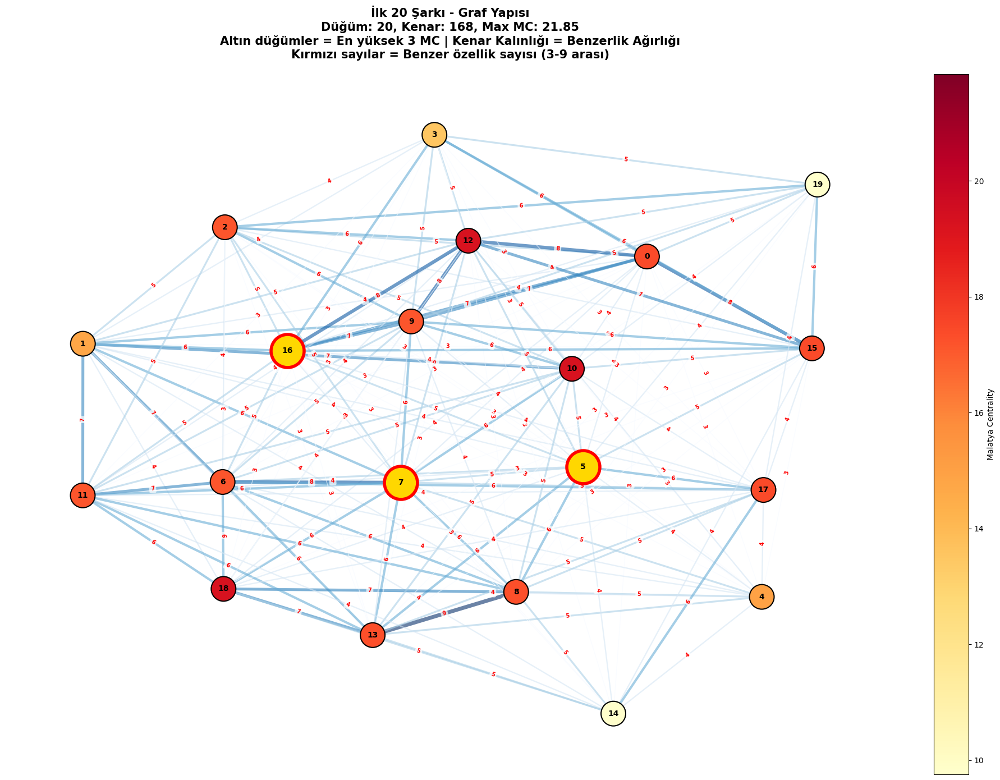


📊 ANALİZ: İLK 50 ŞARKI
✓ 50 şarkı alındı
✓ Özellikler kategorize edildi
✓ Graf oluşturuldu
  - Düğüm Sayısı: 50
  - Kenar Sayısı: 1207
  - Ortalama Derece: 48.28
✓ Malatya Centrality hesaplandı

🏆 EN YÜKSEK MALATYA CENTRALITY:
  Düğüm: 0
  Değer: 49.7940
  Derece: 49
  Şarkı: Jason Mraz - I Won't Give Up

📈 İLK 5 EN YÜKSEK DEĞER:
  1. Düğüm 0: 49.7940 (Derece: 49) - Jason Mraz - I Won't Give Up
  2. Düğüm 1: 49.7940 (Derece: 49) - Jason Mraz - 93 Million Miles
  3. Düğüm 3: 49.7940 (Derece: 49) - Boyce Avenue - Fast Car
  4. Düğüm 5: 49.7940 (Derece: 49) - Chris Smither - What They Say
  5. Düğüm 6: 49.7940 (Derece: 49) - Matt Wertz - Walking in a Winter Wonderland

📊 İSTATİSTİKLER:
  Minimum: 36.1995
  Maksimum: 49.7940
  Ortalama: 48.3253
  Medyan: 49.7940
  Std. Sapma: 2.8432

⏱️ Süre: 0.31 saniye

🎨 Graf görselleştiriliyor...
  ✓ 1207 kenar ağırlığı yazıldı
✓ Graf kaydedildi: graf_ilk_50.png


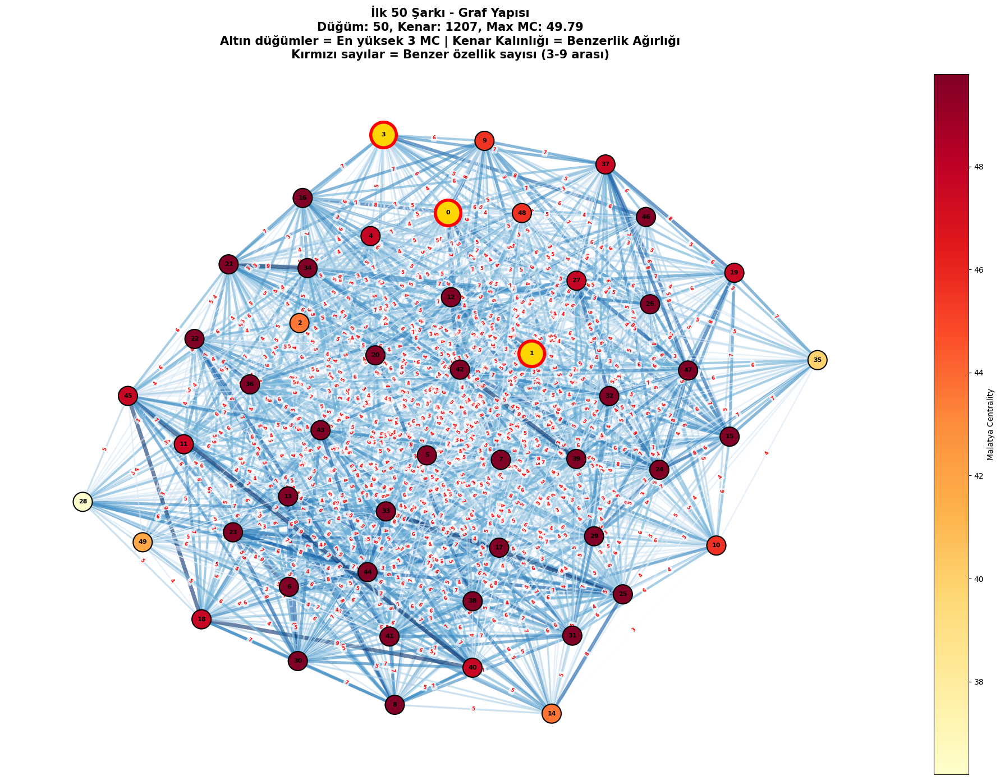


📊 ANALİZ: İLK 100 ŞARKI
✓ 100 şarkı alındı
✓ Özellikler kategorize edildi
✓ Graf oluşturuldu
  - Düğüm Sayısı: 100
  - Kenar Sayısı: 4821
  - Ortalama Derece: 96.42
✓ Malatya Centrality hesaplandı

🏆 EN YÜKSEK MALATYA CENTRALITY:
  Düğüm: 5
  Değer: 101.8845
  Derece: 99
  Şarkı: Chris Smither - What They Say

📈 İLK 5 EN YÜKSEK DEĞER:
  1. Düğüm 5: 101.8845 (Derece: 99) - Chris Smither - What They Say
  2. Düğüm 6: 101.8845 (Derece: 99) - Matt Wertz - Walking in a Winter Wonderland
  3. Düğüm 13: 101.8845 (Derece: 99) - Jason Mraz - The Woman I Love
  4. Düğüm 17: 101.8845 (Derece: 99) - Harley Poe - Transvestities Can Be Cannibals Too
  5. Düğüm 21: 101.8845 (Derece: 99) - Jason Mraz - Winter Wonderland

📊 İSTATİSTİKLER:
  Minimum: 57.8733
  Maksimum: 101.8845
  Ortalama: 96.5991
  Medyan: 99.5386
  Std. Sapma: 7.8294

⏱️ Süre: 1.55 saniye

🎨 Graf görselleştiriliyor...
  ✓ Sol panel: 190 kenar ağırlığı yazıldı
✓ Graf kaydedildi: graf_ilk_100.png


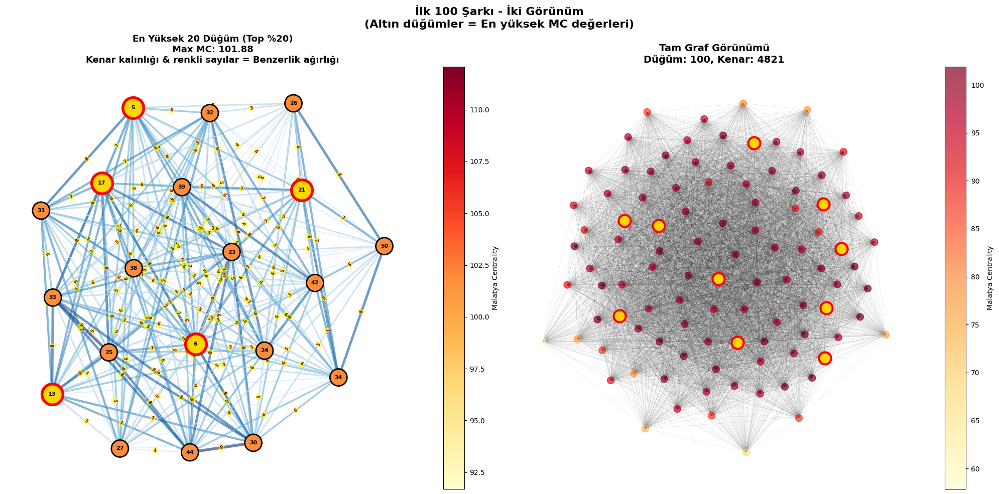


📊 ANALİZ: İLK 200 ŞARKI
✓ 200 şarkı alındı
✓ Özellikler kategorize edildi
✓ Graf oluşturuldu
  - Düğüm Sayısı: 200
  - Kenar Sayısı: 19186
  - Ortalama Derece: 191.86
✓ Malatya Centrality hesaplandı

🏆 EN YÜKSEK MALATYA CENTRALITY:
  Düğüm: 21
  Değer: 207.3223
  Derece: 199
  Şarkı: Jason Mraz - Winter Wonderland

📈 İLK 5 EN YÜKSEK DEĞER:
  1. Düğüm 21: 207.3223 (Derece: 199) - Jason Mraz - Winter Wonderland
  2. Düğüm 42: 207.3223 (Derece: 199) - Boyce Avenue - What Makes You Beautiful
  3. Düğüm 50: 207.3223 (Derece: 199) - David Ramirez - Find the Light
  4. Düğüm 63: 207.3223 (Derece: 199) - Sara Bareilles - Beautiful Girl
  5. Düğüm 66: 207.3223 (Derece: 199) - Boyce Avenue - Here Without You

📊 İSTATİSTİKLER:
  Minimum: 65.4186
  Maksimum: 207.3223
  Ortalama: 192.4813
  Medyan: 199.5600
  Std. Sapma: 19.5522

⏱️ Süre: 4.38 saniye

🎨 Graf görselleştiriliyor...
  ✓ Sol panel: 780 kenar ağırlığı yazıldı
✓ Graf kaydedildi: graf_ilk_200.png


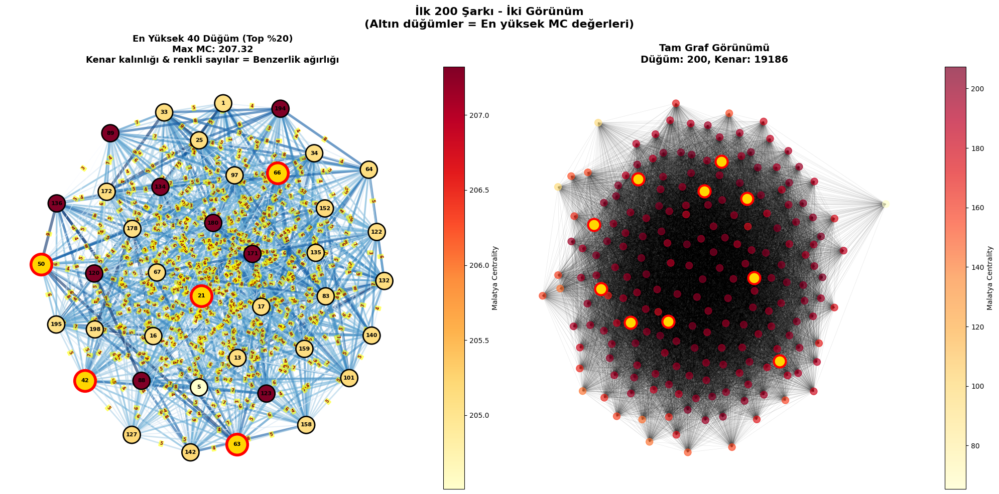


📋 KARŞILAŞTIRMALI ÖZET TABLO
 Boyut  Max_Düğüm Max_Centrality  Max_Derece  Kenar_Sayısı Ort_Derece Ort_Centrality       Sanatçı                          Şarkı
    10          6        11.4464           9            37       7.40         7.6081    Matt Wertz Walking in a Winter Wonderland
    20          5        21.8458          19           168      16.80        16.9600 Chris Smither                  What They Say
    50          0        49.7940          49          1207      48.28        48.3253    Jason Mraz                I Won't Give Up
   100          5       101.8845          99          4821      96.42        96.5991 Chris Smither                  What They Say
   200         21       207.3223         199         19186     191.86       192.4813    Jason Mraz              Winter Wonderland

📊 GÖRSELLEŞTİRMELER OLUŞTURULUYOR...

🎨 Tüm graflar birlikte görselleştiriliyor...
✓ Özet grafik kaydedildi: tum_graflar_ozet.png


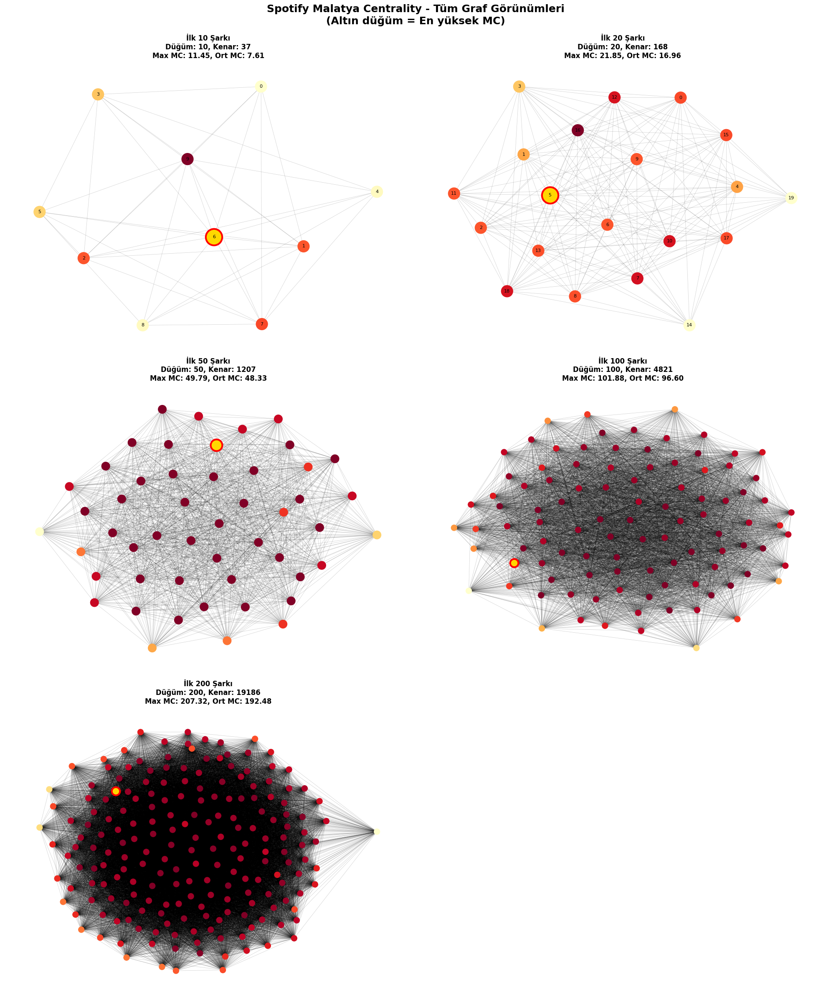

✓ Grafikler kaydedildi: malatya_analiz_grafikleri.png


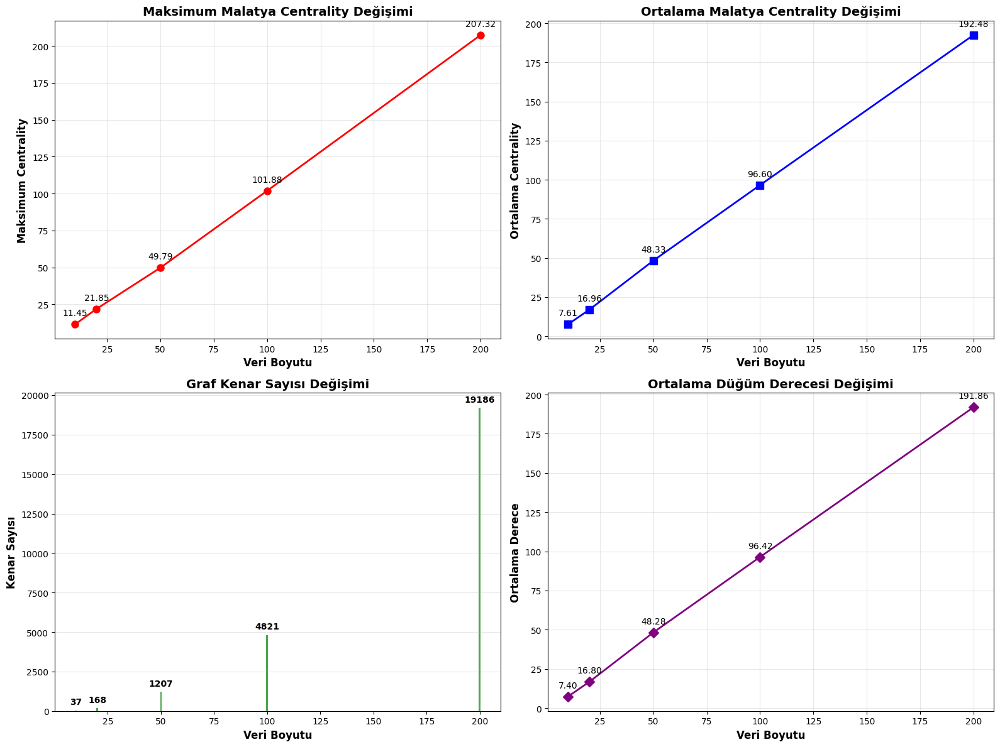


📄 EXCEL RAPORU OLUŞTURULUYOR...
✓ Excel raporu oluşturuldu: malatya_centrality_rapor.xlsx

✅ TÜM ANALİZLER TAMAMLANDI!


In [20]:
# ============================================
# ÇOKLU ANALİZ: 10, 20, 50, 100, 200 ŞARKI
# ============================================

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import time

# Analiz yapılacak boyutlar
BOYUTLAR = [10, 20, 50, 100, 200]

# Tüm sonuçları saklamak için
tum_sonuclar = {}

print("=" * 80)
print("SPOTIFY MALATYA CENTRALITY - ÇOKLU ANALİZ")
print("=" * 80)
print(f"\nAnaliz Boyutları: {BOYUTLAR}")
print("\n" + "=" * 80)

# Her boyut için analiz yap
for boyut in BOYUTLAR:
    print(f"\n{'='*80}")
    print(f"📊 ANALİZ: İLK {boyut} ŞARKI")
    print(f"{'='*80}")

    baslangic = time.time()

    # 1. Veriyi al
    df_subset = df.head(boyut).reset_index(drop=True)
    print(f"✓ {boyut} şarkı alındı")

    # 2. Kategorize et
    df_kategorik = veri_kategorize(df_subset)
    print(f"✓ Özellikler kategorize edildi")

    # 3. Graf oluştur
    G = graf_olustur(df_kategorik, esik=3)
    print(f"✓ Graf oluşturuldu")
    print(f"  - Düğüm Sayısı: {G.number_of_nodes()}")
    print(f"  - Kenar Sayısı: {G.number_of_edges()}")
    print(f"  - Ortalama Derece: {2*G.number_of_edges()/G.number_of_nodes():.2f}")

    # 4. Malatya Centrality hesapla
    malatya_values = malatya_centrality(G)
    print(f"✓ Malatya Centrality hesaplandı")

    # 5. En yüksek değerleri bul
    if len(malatya_values) > 0:
        sorted_nodes = sorted(malatya_values.items(), key=lambda x: x[1], reverse=True)
        max_node = sorted_nodes[0]

        print(f"\n🏆 EN YÜKSEK MALATYA CENTRALITY:")
        print(f"  Düğüm: {max_node[0]}")
        print(f"  Değer: {max_node[1]:.4f}")
        print(f"  Derece: {G.degree(max_node[0])}")
        print(f"  Şarkı: {df_subset.loc[max_node[0], 'artist_name']} - {df_subset.loc[max_node[0], 'track_name']}")

        # İlk 5'i göster
        print(f"\n📈 İLK 5 EN YÜKSEK DEĞER:")
        for i, (node, value) in enumerate(sorted_nodes[:5], 1):
            artist = df_subset.loc[node, 'artist_name']
            track = df_subset.loc[node, 'track_name']
            degree = G.degree(node)
            print(f"  {i}. Düğüm {node}: {value:.4f} (Derece: {degree}) - {artist} - {track}")

        # İstatistikler
        values_list = list(malatya_values.values())
        print(f"\n📊 İSTATİSTİKLER:")
        print(f"  Minimum: {min(values_list):.4f}")
        print(f"  Maksimum: {max(values_list):.4f}")
        print(f"  Ortalama: {np.mean(values_list):.4f}")
        print(f"  Medyan: {np.median(values_list):.4f}")
        print(f"  Std. Sapma: {np.std(values_list):.4f}")

        # Sonuçları sakla
        tum_sonuclar[boyut] = {
            'max_node': max_node[0],
            'max_value': max_node[1],
            'max_degree': G.degree(max_node[0]),
            'max_artist': df_subset.loc[max_node[0], 'artist_name'],
            'max_track': df_subset.loc[max_node[0], 'track_name'],
            'num_nodes': G.number_of_nodes(),
            'num_edges': G.number_of_edges(),
            'avg_degree': 2*G.number_of_edges()/G.number_of_nodes() if G.number_of_nodes() > 0 else 0,
            'min_centrality': min(values_list),
            'max_centrality': max(values_list),
            'avg_centrality': np.mean(values_list),
            'median_centrality': np.median(values_list),
            'std_centrality': np.std(values_list),
            'all_values': malatya_values
        }
    else:
        print("⚠️ Graf bağlantısız, Malatya Centrality hesaplanamadı!")
        tum_sonuclar[boyut] = None

    bitis = time.time()
    print(f"\n⏱️ Süre: {bitis - baslangic:.2f} saniye")

    # ============================================
    # GRAF GÖRSELLEŞTİRME
    # ============================================

    print(f"\n🎨 Graf görselleştiriliyor...")

    # Büyük graflar için özel yaklaşım
    if boyut <= 50:
        # Küçük graflar: Tam görselleştirme
        fig, ax = plt.subplots(figsize=(18, 14))

        pos = nx.spring_layout(G, k=3, iterations=100, seed=42)
        node_size = 1000 if boyut <= 20 else 600
        font_size = 10 if boyut <= 20 else 8

        # Düğüm renkleri
        node_colors = [malatya_values.get(node, 0) for node in G.nodes()]

        if len(node_colors) > 0:
            nodes = nx.draw_networkx_nodes(G, pos, node_color=node_colors,
                                   node_size=node_size, cmap='YlOrRd',
                                   vmin=min(node_colors),
                                   vmax=max(node_colors), ax=ax,
                                   edgecolors='black', linewidths=1.5)

            # En yüksek 3 düğümü vurgula
            sorted_nodes = sorted(malatya_values.items(), key=lambda x: x[1], reverse=True)[:3]
            top_nodes = [n[0] for n in sorted_nodes]
            top_pos = {k: v for k, v in pos.items() if k in top_nodes}
            nx.draw_networkx_nodes(G, top_pos, nodelist=top_nodes,
                                   node_color='gold', node_size=node_size*1.8,
                                   edgecolors='red', linewidths=4, ax=ax)

        # Etiketler
        nx.draw_networkx_labels(G, pos, font_size=font_size, font_weight='bold', ax=ax)

        # Kenarlar - ağırlığa göre kalınlık
        edges = G.edges()
        weights = [G[u][v]['weight'] for u, v in edges]

        if len(weights) > 0:
            # Ağırlığa göre normalize et
            max_weight = max(weights)
            min_weight = min(weights)

            # Kenar kalınlıkları (1-5 arası)
            if max_weight > min_weight:
                edge_widths = [1 + 4 * (w - min_weight) / (max_weight - min_weight) for w in weights]
            else:
                edge_widths = [2.5] * len(weights)

            # Kenar renklendir (ağırlığa göre)
            edge_colors = weights

            nx.draw_networkx_edges(G, pos, alpha=0.6, width=edge_widths,
                                   edge_color=edge_colors, edge_cmap=plt.cm.Blues,
                                   edge_vmin=min(weights), edge_vmax=max(weights), ax=ax)
        else:
            nx.draw_networkx_edges(G, pos, alpha=0.3, width=1.5, ax=ax)

        # Kenar ağırlıklarını YAZ
        if boyut <= 50:
            edge_labels = nx.get_edge_attributes(G, 'weight')
            nx.draw_networkx_edge_labels(G, pos, edge_labels,
                                         font_size=7 if boyut <= 20 else 6,
                                         font_color='red',
                                         font_weight='bold',
                                         bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='none', alpha=0.7),
                                         ax=ax)
            print(f"  ✓ {len(edge_labels)} kenar ağırlığı yazıldı")

        ax.set_title(f'İlk {boyut} Şarkı - Graf Yapısı\n' +
                     f'Düğüm: {G.number_of_nodes()}, Kenar: {G.number_of_edges()}, ' +
                     f'Max MC: {tum_sonuclar[boyut]["max_centrality"]:.2f}\n' +
                     f'Altın düğümler = En yüksek 3 MC | Kenar Kalınlığı = Benzerlik Ağırlığı\n' +
                     f'Kırmızı sayılar = Benzer özellik sayısı (3-9 arası)',
                     fontsize=15, fontweight='bold', pad=20)

        if len(node_colors) > 0:
            cbar = plt.colorbar(nodes, ax=ax, label='Malatya Centrality', fraction=0.046, pad=0.04)
            cbar.ax.tick_params(labelsize=10)

        ax.axis('off')

    else:
        # Büyük graflar (100, 200): İki görselleştirme stratejisi
        fig = plt.figure(figsize=(20, 10))

        # SOL: Sadece en yüksek MC değerine sahip düğümleri göster
        ax1 = plt.subplot(1, 2, 1)

        # En yüksek %20'lik dilimi al
        top_n = max(20, int(boyut * 0.2))
        sorted_nodes = sorted(malatya_values.items(), key=lambda x: x[1], reverse=True)[:top_n]
        top_node_ids = [n[0] for n in sorted_nodes]

        # Subgraph oluştur
        G_sub = G.subgraph(top_node_ids).copy()

        pos_sub = nx.spring_layout(G_sub, k=2, iterations=100, seed=42)
        node_colors_sub = [malatya_values[node] for node in G_sub.nodes()]

        nodes1 = nx.draw_networkx_nodes(G_sub, pos_sub, node_color=node_colors_sub,
                                node_size=600, cmap='YlOrRd',
                                vmin=min(node_colors_sub),
                                vmax=max(node_colors_sub),
                                edgecolors='black', linewidths=2, ax=ax1)

        # En yüksek 5'i ekstra vurgula
        top_5 = top_node_ids[:5]
        top_5_pos = {k: v for k, v in pos_sub.items() if k in top_5}
        nx.draw_networkx_nodes(G_sub, top_5_pos, nodelist=top_5,
                               node_color='gold', node_size=900,
                               edgecolors='red', linewidths=4, ax=ax1)

        nx.draw_networkx_labels(G_sub, pos_sub, font_size=8, font_weight='bold', ax=ax1)

        # Kenarlar - ağırlıklı
        edges_sub = G_sub.edges()
        weights_sub = [G_sub[u][v]['weight'] for u, v in edges_sub]

        if len(weights_sub) > 0:
            max_w = max(weights_sub)
            min_w = min(weights_sub)
            if max_w > min_w:
                edge_widths = [1 + 3 * (w - min_w) / (max_w - min_w) for w in weights_sub]
            else:
                edge_widths = [2] * len(weights_sub)

            nx.draw_networkx_edges(G_sub, pos_sub, alpha=0.6, width=edge_widths,
                                   edge_color=weights_sub, edge_cmap=plt.cm.Blues,
                                   edge_vmin=min(weights_sub), edge_vmax=max(weights_sub), ax=ax1)

            # Kenar ağırlıklarını yaz (top düğümler için)
            edge_labels_sub = nx.get_edge_attributes(G_sub, 'weight')
            nx.draw_networkx_edge_labels(G_sub, pos_sub, edge_labels_sub,
                                         font_size=6, font_color='darkred',
                                         font_weight='bold',
                                         bbox=dict(boxstyle='round,pad=0.2',
                                                  facecolor='yellow',
                                                  edgecolor='none',
                                                  alpha=0.6),
                                         ax=ax1)
            print(f"  ✓ Sol panel: {len(edge_labels_sub)} kenar ağırlığı yazıldı")
        else:
            nx.draw_networkx_edges(G_sub, pos_sub, alpha=0.4, width=1.5, ax=ax1)

        ax1.set_title(f'En Yüksek {top_n} Düğüm (Top %{int(top_n/boyut*100)})\n' +
                      f'Max MC: {sorted_nodes[0][1]:.2f}\n' +
                      f'Kenar kalınlığı & renkli sayılar = Benzerlik ağırlığı',
                      fontsize=13, fontweight='bold')
        ax1.axis('off')

        if len(node_colors_sub) > 0:
            plt.colorbar(nodes1, ax=ax1, label='Malatya Centrality', fraction=0.046)

        # SAĞ: Tam graf (basitleştirilmiş)
        ax2 = plt.subplot(1, 2, 2)

        pos_full = nx.spring_layout(G, k=1, iterations=50, seed=42)
        node_colors_full = [malatya_values.get(node, 0) for node in G.nodes()]

        nodes2 = nx.draw_networkx_nodes(G, pos_full, node_color=node_colors_full,
                                node_size=100, cmap='YlOrRd',
                                vmin=min(node_colors_full),
                                vmax=max(node_colors_full),
                                alpha=0.7, ax=ax2)

        # En yüksek 10'u vurgula
        top_10 = sorted_nodes[:10]
        top_10_ids = [n[0] for n in top_10]
        top_10_pos = {k: v for k, v in pos_full.items() if k in top_10_ids}
        nx.draw_networkx_nodes(G, top_10_pos, nodelist=top_10_ids,
                               node_color='gold', node_size=300,
                               edgecolors='red', linewidths=3, ax=ax2)

        nx.draw_networkx_edges(G, pos_full, alpha=0.1, width=0.5, ax=ax2)

        ax2.set_title(f'Tam Graf Görünümü\n' +
                      f'Düğüm: {G.number_of_nodes()}, Kenar: {G.number_of_edges()}',
                      fontsize=14, fontweight='bold')
        ax2.axis('off')

        if len(node_colors_full) > 0:
            plt.colorbar(nodes2, ax=ax2, label='Malatya Centrality', fraction=0.046)

        plt.suptitle(f'İlk {boyut} Şarkı - İki Görünüm\n' +
                     f'(Altın düğümler = En yüksek MC değerleri)',
                     fontsize=16, fontweight='bold', y=0.98)

    plt.tight_layout()

    # Kaydet
    dosya_adi = f'graf_ilk_{boyut}.png'
    plt.savefig(dosya_adi, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✓ Graf kaydedildi: {dosya_adi}")
    plt.show()
    plt.close()

# ============================================
# KARŞILAŞTIRMALI ÖZET TABLO
# ============================================

print("\n" + "=" * 80)
print("📋 KARŞILAŞTIRMALI ÖZET TABLO")
print("=" * 80)

ozet_data = []
for boyut in BOYUTLAR:
    if tum_sonuclar[boyut] is not None:
        sonuc = tum_sonuclar[boyut]
        ozet_data.append({
            'Boyut': boyut,
            'Max_Düğüm': sonuc['max_node'],
            'Max_Centrality': f"{sonuc['max_centrality']:.4f}",
            'Max_Derece': sonuc['max_degree'],
            'Kenar_Sayısı': sonuc['num_edges'],
            'Ort_Derece': f"{sonuc['avg_degree']:.2f}",
            'Ort_Centrality': f"{sonuc['avg_centrality']:.4f}",
            'Sanatçı': sonuc['max_artist'],
            'Şarkı': sonuc['max_track'][:30] + '...' if len(sonuc['max_track']) > 30 else sonuc['max_track']
        })

ozet_df = pd.DataFrame(ozet_data)
print(ozet_df.to_string(index=False))

# ============================================
# GÖRSELLEŞTİRMELER
# ============================================

print("\n" + "=" * 80)
print("📊 GÖRSELLEŞTİRMELER OLUŞTURULUYOR...")
print("=" * 80)

# ============================================
# TÜM GRAFLARI BİRLİKTE GÖSTER (2x3 LAYOUT)
# ============================================

print("\n🎨 Tüm graflar birlikte görselleştiriliyor...")

fig = plt.figure(figsize=(20, 24))

for idx, boyut in enumerate(BOYUTLAR, 1):
    if tum_sonuclar[boyut] is not None:
        ax = plt.subplot(3, 2, idx)

        # Graf bilgilerini al
        df_subset = df.head(boyut).reset_index(drop=True)
        df_kategorik = veri_kategorize(df_subset)
        G = graf_olustur(df_kategorik, esik=3)
        malatya_values = tum_sonuclar[boyut]['all_values']

        # Layout
        if boyut <= 20:
            pos = nx.spring_layout(G, k=2.5, iterations=50, seed=42)
            node_size = 400
            font_size = 8
            show_labels = True
        elif boyut <= 50:
            pos = nx.spring_layout(G, k=2, iterations=50, seed=42)
            node_size = 200
            font_size = 6
            show_labels = False
        else:
            pos = nx.spring_layout(G, k=1.5, iterations=50, seed=42)
            node_size = 100
            font_size = 4
            show_labels = False

        # Renklendirme
        node_colors = [malatya_values.get(node, 0) for node in G.nodes()]

        if len(node_colors) > 0:
            # Düğümleri çiz
            nx.draw_networkx_nodes(G, pos, node_color=node_colors,
                                   node_size=node_size, cmap='YlOrRd',
                                   vmin=min(node_colors),
                                   vmax=max(node_colors), ax=ax)

            # En yüksek düğümü vurgula
            max_node = max(malatya_values.items(), key=lambda x: x[1])[0]
            nx.draw_networkx_nodes(G, pos, nodelist=[max_node],
                                   node_color='gold', node_size=node_size*2,
                                   edgecolors='red', linewidths=3, ax=ax)

        # Etiketler
        if show_labels:
            nx.draw_networkx_labels(G, pos, font_size=font_size, ax=ax)

        # Kenarlar
        nx.draw_networkx_edges(G, pos, alpha=0.2, width=0.5, ax=ax)

        # Başlık
        max_cent = tum_sonuclar[boyut]['max_centrality']
        avg_cent = tum_sonuclar[boyut]['avg_centrality']
        ax.set_title(f'İlk {boyut} Şarkı\n' +
                     f'Düğüm: {G.number_of_nodes()}, Kenar: {G.number_of_edges()}\n' +
                     f'Max MC: {max_cent:.2f}, Ort MC: {avg_cent:.2f}',
                     fontsize=12, fontweight='bold')
        ax.axis('off')

plt.suptitle('Spotify Malatya Centrality - Tüm Graf Görünümleri\n(Altın düğüm = En yüksek MC)',
             fontsize=18, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('tum_graflar_ozet.png', dpi=300, bbox_inches='tight', facecolor='white')
print("✓ Özet grafik kaydedildi: tum_graflar_ozet.png")
plt.show()
plt.close()

# ============================================
# İSTATİSTİK GRAFİKLERİ
# ============================================

# 1. Maksimum Centrality Değişimi
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Grafik 1: Max Centrality vs Boyut
ax1 = axes[0, 0]
boyutlar_list = [b for b in BOYUTLAR if tum_sonuclar[b] is not None]
max_centralities = [tum_sonuclar[b]['max_centrality'] for b in boyutlar_list]
ax1.plot(boyutlar_list, max_centralities, marker='o', linewidth=2, markersize=8, color='red')
ax1.set_xlabel('Veri Boyutu', fontsize=12, fontweight='bold')
ax1.set_ylabel('Maksimum Centrality', fontsize=12, fontweight='bold')
ax1.set_title('Maksimum Malatya Centrality Değişimi', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)
for i, (x, y) in enumerate(zip(boyutlar_list, max_centralities)):
    ax1.annotate(f'{y:.2f}', (x, y), textcoords="offset points", xytext=(0,10), ha='center')

# Grafik 2: Ortalama Centrality vs Boyut
ax2 = axes[0, 1]
avg_centralities = [tum_sonuclar[b]['avg_centrality'] for b in boyutlar_list]
ax2.plot(boyutlar_list, avg_centralities, marker='s', linewidth=2, markersize=8, color='blue')
ax2.set_xlabel('Veri Boyutu', fontsize=12, fontweight='bold')
ax2.set_ylabel('Ortalama Centrality', fontsize=12, fontweight='bold')
ax2.set_title('Ortalama Malatya Centrality Değişimi', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)
for i, (x, y) in enumerate(zip(boyutlar_list, avg_centralities)):
    ax2.annotate(f'{y:.2f}', (x, y), textcoords="offset points", xytext=(0,10), ha='center')

# Grafik 3: Kenar Sayısı vs Boyut
ax3 = axes[1, 0]
edge_counts = [tum_sonuclar[b]['num_edges'] for b in boyutlar_list]
ax3.bar(boyutlar_list, edge_counts, color='green', alpha=0.7)
ax3.set_xlabel('Veri Boyutu', fontsize=12, fontweight='bold')
ax3.set_ylabel('Kenar Sayısı', fontsize=12, fontweight='bold')
ax3.set_title('Graf Kenar Sayısı Değişimi', fontsize=14, fontweight='bold')
ax3.grid(True, alpha=0.3, axis='y')
for i, (x, y) in enumerate(zip(boyutlar_list, edge_counts)):
    ax3.text(x, y + max(edge_counts)*0.02, str(y), ha='center', fontweight='bold')

# Grafik 4: Ortalama Derece vs Boyut
ax4 = axes[1, 1]
avg_degrees = [tum_sonuclar[b]['avg_degree'] for b in boyutlar_list]
ax4.plot(boyutlar_list, avg_degrees, marker='D', linewidth=2, markersize=8, color='purple')
ax4.set_xlabel('Veri Boyutu', fontsize=12, fontweight='bold')
ax4.set_ylabel('Ortalama Derece', fontsize=12, fontweight='bold')
ax4.set_title('Ortalama Düğüm Derecesi Değişimi', fontsize=14, fontweight='bold')
ax4.grid(True, alpha=0.3)
for i, (x, y) in enumerate(zip(boyutlar_list, avg_degrees)):
    ax4.annotate(f'{y:.2f}', (x, y), textcoords="offset points", xytext=(0,10), ha='center')

plt.tight_layout()
plt.savefig('malatya_analiz_grafikleri.png', dpi=300, bbox_inches='tight')
print("✓ Grafikler kaydedildi: malatya_analiz_grafikleri.png")
plt.show()

# ============================================
# DETAYLI EXCEL RAPORU OLUŞTUR
# ============================================

print("\n" + "=" * 80)
print("📄 EXCEL RAPORU OLUŞTURULUYOR...")
print("=" * 80)

try:
    with pd.ExcelWriter('malatya_centrality_rapor.xlsx', engine='openpyxl') as writer:
        # Sayfa 1: Özet
        ozet_df.to_excel(writer, sheet_name='Özet', index=False)

        # Her boyut için ayrı sayfa
        for boyut in BOYUTLAR:
            if tum_sonuclar[boyut] is not None:
                sonuc = tum_sonuclar[boyut]
                df_subset = df.head(boyut).reset_index(drop=True)

                # Detaylı sonuçlar
                detay_data = []
                for node, value in sorted(sonuc['all_values'].items(), key=lambda x: x[1], reverse=True):
                    detay_data.append({
                        'Düğüm': node,
                        'Malatya_Centrality': f"{value:.4f}",
                        'Derece': G.degree(node),
                        'Sanatçı': df_subset.loc[node, 'artist_name'],
                        'Şarkı': df_subset.loc[node, 'track_name'],
                        'Tür': df_subset.loc[node, 'genre']
                    })

                detay_df = pd.DataFrame(detay_data)
                detay_df.to_excel(writer, sheet_name=f'İlk_{boyut}', index=False)

        print("✓ Excel raporu oluşturuldu: malatya_centrality_rapor.xlsx")
except Exception as e:
    print(f"⚠️ Excel oluşturulamadı: {e}")

print("\n" + "=" * 80)
print("✅ TÜM ANALİZLER TAMAMLANDI!")
print("=" * 80)

DÜĞÜM BENZERLİK DETAY ANALİZİ

📊 İlk 100 şarkı için benzerlik tablosu oluşturuluyor...
⏱️  Bu işlem 30-60 saniye sürebilir...

✓ 4821 düğüm çifti bulundu (en az 3 benzer özellik)

📈 BENZERLİK İSTATİSTİKLERİ
Toplam Düğüm Çifti: 4821
En Yüksek Benzerlik: 9 özellik
En Düşük Benzerlik: 3 özellik
Ortalama Benzerlik: 5.16 özellik
Medyan Benzerlik: 5.0 özellik

📊 Benzerlik Dağılımı:
  3 özellik:  585 çift ( 12.1%) ██████
  4 özellik: 1111 çift ( 23.0%) ███████████
  5 özellik: 1241 çift ( 25.7%) ████████████
  6 özellik: 1016 çift ( 21.1%) ██████████
  7 özellik:  610 çift ( 12.7%) ██████
  8 özellik:  220 çift (  4.6%) ██
  9 özellik:   38 çift (  0.8%) 

ÖZET TABLO (İlk 30 - En Yüksek Benzerlikten Başlayarak)
 Düğüm_1  Düğüm_2  Benzer_Özellik_Sayısı                                                                                     Benzer_Özellikler
       0       53                      9 danceability, energy, loudness, speechiness, acousticness, instrumentalness, liveness, valence, tempo


/tmp/ipython-input-2783510362.py:389: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-2783510362.py:389: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-2783510362.py:389: UserWarning: Glyph 127942 (\N{TROPHY}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
/tmp/ipython-input-2783510362.py:390: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  plt.savefig(f'benzerlik_analiz_ilk_{ANALIZ_BOYUTU}.png', dpi=300, bbox_inches='tight', facecolor='white')
/tmp/ipython-input-2783510362.py:390: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  plt.savefig(f'benzerlik_analiz_ilk_{ANALIZ_BOYUTU}.png', dpi=300, bbox_inches='tight', facecolor='white')
/tmp/ipython-input-2783510362.py:390: UserWarning: Glyph 127942 (\N{TROPHY}) missing from font(s) DejaVu Sans Mono.
  plt.savef

✓ Görselleştirme kaydedildi: benzerlik_analiz_ilk_100.png


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127942 (\N{TROPHY}) missing from font(s) DejaVu Sans Mono.
  fig.canvas.print_figure(bytes_io, **kw)


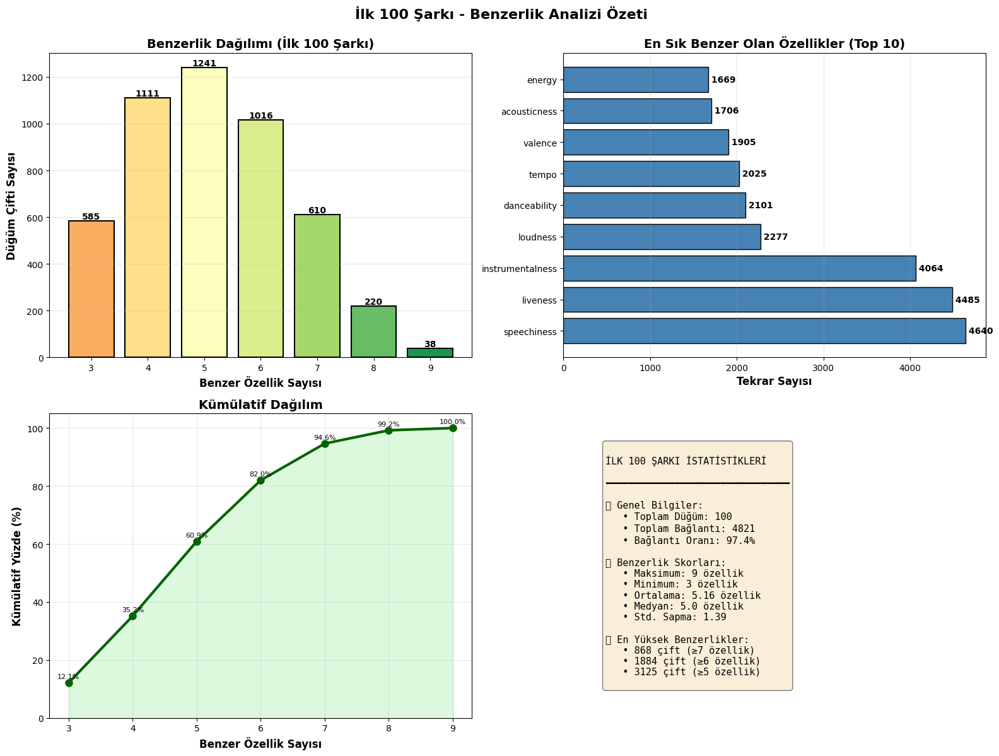


✅ ANALİZ TAMAMLANDI!


In [22]:
# ============================================
# DÜĞÜM BENZERLİK DETAY TABLOSU
# Hangi düğümler arasında hangi özellikler benzer?
# ============================================

import pandas as pd
import numpy as np

def benzer_ozellikleri_bul_detayli(row1, row2, df_original, idx1, idx2):
    """
    İki düğüm arasındaki benzer özellikleri detaylı olarak bul
    """
    kategorik_kolonlar = [col for col in row1.index if col.endswith('_cat')]
    benzer_ozellikler = []
    benzer_bilgiler = []

    for col in kategorik_kolonlar:
        if row1[col] == row2[col]:
            # Özellik adı
            ozellik_adi = col.replace('_cat', '')
            benzer_ozellikler.append(ozellik_adi)

            # Orijinal değerleri de al
            deger1 = df_original.loc[idx1, ozellik_adi]
            deger2 = df_original.loc[idx2, ozellik_adi]
            kategori = row1[col]  # 0=Düşük, 1=Orta, 2=Yüksek

            kategori_adi = ['Düşük', 'Orta', 'Yüksek'][int(kategori)]

            benzer_bilgiler.append({
                'ozellik': ozellik_adi,
                'kategori': kategori_adi,
                'deger1': deger1,
                'deger2': deger2
            })

    return benzer_ozellikler, benzer_bilgiler


def benzerlik_tablosu_olustur(df_kategorik, df_original, esik=3):
    """
    Tüm düğüm çiftleri için benzerlik tablosu oluştur
    """
    tablo_data = []

    n = len(df_kategorik)
    for i in range(n):
        for j in range(i+1, n):
            # Benzer özellik sayısını hesapla
            benzerlik_sayisi = 0
            kategorik_kolonlar = [col for col in df_kategorik.iloc[i].index if col.endswith('_cat')]

            for col in kategorik_kolonlar:
                if df_kategorik.iloc[i][col] == df_kategorik.iloc[j][col]:
                    benzerlik_sayisi += 1

            # Sadece eşik değerini geçenleri al
            if benzerlik_sayisi >= esik:
                benzer_ozellikler, benzer_bilgiler = benzer_ozellikleri_bul_detayli(
                    df_kategorik.iloc[i],
                    df_kategorik.iloc[j],
                    df_original,
                    df_kategorik.index[i],
                    df_kategorik.index[j]
                )

                # Şarkı bilgileri
                dugum1 = df_kategorik.index[i]
                dugum2 = df_kategorik.index[j]
                sarki1 = df_original.loc[dugum1, 'track_name']
                sanatci1 = df_original.loc[dugum1, 'artist_name']
                sarki2 = df_original.loc[dugum2, 'track_name']
                sanatci2 = df_original.loc[dugum2, 'artist_name']

                tablo_data.append({
                    'Düğüm_1': dugum1,
                    'Şarkı_1': f"{sanatci1} - {sarki1}",
                    'Düğüm_2': dugum2,
                    'Şarkı_2': f"{sanatci2} - {sarki2}",
                    'Benzer_Özellik_Sayısı': benzerlik_sayisi,
                    'Benzer_Özellikler': ', '.join(benzer_ozellikler),
                    'Detay': benzer_bilgiler
                })

    return pd.DataFrame(tablo_data)


# ============================================
# KULLANIM
# ============================================

print("=" * 100)
print("DÜĞÜM BENZERLİK DETAY ANALİZİ")
print("=" * 100)

# Hangi boyutu analiz etmek istiyorsunuz?
ANALIZ_BOYUTU = 100  # 100 şarkı için detaylı analiz

print(f"\n📊 İlk {ANALIZ_BOYUTU} şarkı için benzerlik tablosu oluşturuluyor...")
print(f"⏱️  Bu işlem 30-60 saniye sürebilir...\n")

# Veriyi hazırla
df_subset = df.head(ANALIZ_BOYUTU).reset_index(drop=True)
df_kategorik = veri_kategorize(df_subset)

# Benzerlik tablosunu oluştur
benzerlik_df = benzerlik_tablosu_olustur(df_kategorik, df_subset, esik=3)

print(f"✓ {len(benzerlik_df)} düğüm çifti bulundu (en az 3 benzer özellik)\n")

# İSTATİSTİKLER
print("=" * 100)
print("📈 BENZERLİK İSTATİSTİKLERİ")
print("=" * 100)
print(f"Toplam Düğüm Çifti: {len(benzerlik_df)}")
print(f"En Yüksek Benzerlik: {benzerlik_df['Benzer_Özellik_Sayısı'].max()} özellik")
print(f"En Düşük Benzerlik: {benzerlik_df['Benzer_Özellik_Sayısı'].min()} özellik")
print(f"Ortalama Benzerlik: {benzerlik_df['Benzer_Özellik_Sayısı'].mean():.2f} özellik")
print(f"Medyan Benzerlik: {benzerlik_df['Benzer_Özellik_Sayısı'].median():.1f} özellik")

# Dağılım
print(f"\n📊 Benzerlik Dağılımı:")
dagilim = benzerlik_df['Benzer_Özellik_Sayısı'].value_counts().sort_index()
for sayi, adet in dagilim.items():
    yuzde = (adet / len(benzerlik_df)) * 100
    bar = '█' * int(yuzde / 2)
    print(f"  {sayi} özellik: {adet:4d} çift ({yuzde:5.1f}%) {bar}")

# Tabloyu göster (ilk 30 satır)
print("\n" + "=" * 100)
print("ÖZET TABLO (İlk 30 - En Yüksek Benzerlikten Başlayarak)")
print("=" * 100)
ozet_df = benzerlik_df.nlargest(30, 'Benzer_Özellik_Sayısı')[['Düğüm_1', 'Düğüm_2', 'Benzer_Özellik_Sayısı', 'Benzer_Özellikler']]
print(ozet_df.to_string(index=False))

# ============================================
# DETAYLI GÖRÜNÜM - ÖRNEKLER
# ============================================

print("\n" + "=" * 100)
print("DETAYLI GÖRÜNÜM - İLK 5 ÇİFT")
print("=" * 100)

for idx, row in benzerlik_df.head(5).iterrows():
    print(f"\n{'='*100}")
    print(f"🔗 BAĞLANTI {idx+1}: Düğüm {row['Düğüm_1']} ↔ Düğüm {row['Düğüm_2']}")
    print(f"{'='*100}")
    print(f"🎵 Şarkı 1: {row['Şarkı_1']}")
    print(f"🎵 Şarkı 2: {row['Şarkı_2']}")
    print(f"📊 Benzer Özellik Sayısı: {row['Benzer_Özellik_Sayısı']}")
    print(f"\n📋 Benzer Özellikler:")
    print("-" * 100)

    for detay in row['Detay']:
        print(f"  ✓ {detay['ozellik'].upper():<20} | Kategori: {detay['kategori']:<8} | "
              f"Düğüm {row['Düğüm_1']}: {detay['deger1']:.4f}  |  "
              f"Düğüm {row['Düğüm_2']}: {detay['deger2']:.4f}")

# ============================================
# EN YÜKSEK BENZERLİKLER
# ============================================

print("\n" + "=" * 100)
print("🏆 EN YÜKSEK BENZERLİK SKORLARI")
print("=" * 100)

top_benzerlikler = benzerlik_df.nlargest(10, 'Benzer_Özellik_Sayısı')
print(f"\nEn benzer {len(top_benzerlikler)} düğüm çifti:\n")

for idx, row in top_benzerlikler.iterrows():
    print(f"{row['Benzer_Özellik_Sayısı']} benzer özellik → "
          f"Düğüm {row['Düğüm_1']} & {row['Düğüm_2']}")
    print(f"  Şarkılar: {row['Şarkı_1'][:50]}... ↔ {row['Şarkı_2'][:50]}...")
    print(f"  Özellikler: {row['Benzer_Özellikler']}")
    print()

# ============================================
# BELİRLİ BİR DÜĞÜM ÇİFTİNİ ARAMA
# ============================================

print("\n" + "=" * 100)
print("🔍 BELİRLİ DÜĞÜM ÇİFTİNİ ARAMA")
print("=" * 100)

# Örnek: 3 ve 4 numaralı düğümleri ara
DUGUM_1 = 3
DUGUM_2 = 4

# Arama yap
sonuc = benzerlik_df[
    ((benzerlik_df['Düğüm_1'] == DUGUM_1) & (benzerlik_df['Düğüm_2'] == DUGUM_2)) |
    ((benzerlik_df['Düğüm_1'] == DUGUM_2) & (benzerlik_df['Düğüm_2'] == DUGUM_1))
]

if len(sonuc) > 0:
    row = sonuc.iloc[0]
    print(f"\n✓ Düğüm {DUGUM_1} ve Düğüm {DUGUM_2} arasında bağlantı bulundu!")
    print(f"\n🎵 Şarkı {DUGUM_1}: {row['Şarkı_1'] if row['Düğüm_1'] == DUGUM_1 else row['Şarkı_2']}")
    print(f"🎵 Şarkı {DUGUM_2}: {row['Şarkı_2'] if row['Düğüm_1'] == DUGUM_1 else row['Şarkı_1']}")
    print(f"\n📊 Benzer Özellik Sayısı: {row['Benzer_Özellik_Sayısı']}")
    print(f"📋 Benzer Özellikler: {row['Benzer_Özellikler']}")

    print(f"\n📈 Detaylı Karşılaştırma:")
    print("-" * 100)
    for detay in row['Detay']:
        print(f"  {detay['ozellik'].upper():<20} | {detay['kategori']:<8} | "
              f"{detay['deger1']:.4f} ↔ {detay['deger2']:.4f}")
else:
    print(f"\n⚠️  Düğüm {DUGUM_1} ve Düğüm {DUGUM_2} arasında bağlantı yok!")
    print(f"   (En az 3 benzer özellik gerekli)")

# ============================================
# BİR DÜĞÜMÜN TÜM BAĞLANTILARINI GÖSTER
# ============================================

print("\n" + "=" * 100)
print("🔗 BİR DÜĞÜMÜN TÜM BAĞLANTILARI")
print("=" * 100)

SECILI_DUGUM = 0  # Hangi düğümü görmek istiyorsunuz?

dugum_baglantilari = benzerlik_df[
    (benzerlik_df['Düğüm_1'] == SECILI_DUGUM) |
    (benzerlik_df['Düğüm_2'] == SECILI_DUGUM)
].copy()

if len(dugum_baglantilari) > 0:
    print(f"\n🎵 Düğüm {SECILI_DUGUM}: {df_subset.loc[SECILI_DUGUM, 'artist_name']} - {df_subset.loc[SECILI_DUGUM, 'track_name']}")
    print(f"\n✓ {len(dugum_baglantilari)} bağlantı bulundu:\n")

    for idx, row in dugum_baglantilari.iterrows():
        diger_dugum = row['Düğüm_2'] if row['Düğüm_1'] == SECILI_DUGUM else row['Düğüm_1']
        print(f"  → Düğüm {diger_dugum} | {row['Benzer_Özellik_Sayısı']} benzer özellik | {row['Benzer_Özellikler']}")
else:
    print(f"\n⚠️  Düğüm {SECILI_DUGUM} için bağlantı yok!")

# ============================================
# EXCEL'E KAYDET
# ============================================

print("\n" + "=" * 100)
print("💾 EXCEL'E KAYDETME")
print("=" * 100)

try:
    with pd.ExcelWriter(f'benzerlik_detay_ilk_{ANALIZ_BOYUTU}.xlsx', engine='openpyxl') as writer:
        # Sayfa 1: Ana Tablo
        benzerlik_df_excel = benzerlik_df.copy()
        benzerlik_df_excel['Detay_Text'] = benzerlik_df_excel['Detay'].apply(
            lambda x: ' | '.join([f"{d['ozellik']}: {d['kategori']}" for d in x])
        )
        benzerlik_df_excel_final = benzerlik_df_excel.drop('Detay', axis=1)
        benzerlik_df_excel_final.to_excel(writer, index=False, sheet_name='Tum_Benzerlikler')

        # Sayfa 2: En Yüksek Benzerlikler
        top_20 = benzerlik_df.nlargest(20, 'Benzer_Özellik_Sayısı').copy()
        top_20['Detay_Text'] = top_20['Detay'].apply(
            lambda x: ' | '.join([f"{d['ozellik']}: {d['kategori']}" for d in x])
        )
        top_20_final = top_20.drop('Detay', axis=1)
        top_20_final.to_excel(writer, index=False, sheet_name='Top_20_Benzerlikler')

        # Sayfa 3: İstatistikler
        stats_data = {
            'Metrik': [
                'Toplam Düğüm Çifti',
                'En Yüksek Benzerlik',
                'En Düşük Benzerlik',
                'Ortalama Benzerlik',
                'Medyan Benzerlik'
            ],
            'Değer': [
                len(benzerlik_df),
                benzerlik_df['Benzer_Özellik_Sayısı'].max(),
                benzerlik_df['Benzer_Özellik_Sayısı'].min(),
                f"{benzerlik_df['Benzer_Özellik_Sayısı'].mean():.2f}",
                benzerlik_df['Benzer_Özellik_Sayısı'].median()
            ]
        }
        stats_df = pd.DataFrame(stats_data)
        stats_df.to_excel(writer, index=False, sheet_name='Istatistikler')

        # Sayfa 4: Dağılım
        dagilim_df = benzerlik_df['Benzer_Özellik_Sayısı'].value_counts().sort_index().reset_index()
        dagilim_df.columns = ['Benzer_Özellik_Sayısı', 'Çift_Sayısı']
        dagilim_df['Yüzde'] = (dagilim_df['Çift_Sayısı'] / len(benzerlik_df) * 100).round(2)
        dagilim_df.to_excel(writer, index=False, sheet_name='Dagilim')

    print(f"✓ Excel raporu kaydedildi: benzerlik_detay_ilk_{ANALIZ_BOYUTU}.xlsx")
    print(f"  - Sayfa 1: Tüm benzerlikler ({len(benzerlik_df)} satır)")
    print(f"  - Sayfa 2: En yüksek 20 benzerlik")
    print(f"  - Sayfa 3: İstatistikler")
    print(f"  - Sayfa 4: Benzerlik dağılımı")
except Exception as e:
    print(f"⚠️  Excel oluşturulamadı: {e}")

# ============================================
# GÖRSELLEŞTİRME
# ============================================

print("\n" + "=" * 100)
print("📊 GÖRSELLEŞTİRME")
print("=" * 100)

import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Benzerlik Dağılımı (Bar Chart)
ax1 = axes[0, 0]
dagilim = benzerlik_df['Benzer_Özellik_Sayısı'].value_counts().sort_index()
colors = plt.cm.RdYlGn(np.linspace(0.3, 0.9, len(dagilim)))
bars = ax1.bar(dagilim.index, dagilim.values, color=colors, edgecolor='black', linewidth=1.5)
ax1.set_xlabel('Benzer Özellik Sayısı', fontsize=12, fontweight='bold')
ax1.set_ylabel('Düğüm Çifti Sayısı', fontsize=12, fontweight='bold')
ax1.set_title(f'Benzerlik Dağılımı (İlk {ANALIZ_BOYUTU} Şarkı)', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3, axis='y')
for bar in bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
            f'{int(height)}',
            ha='center', va='bottom', fontweight='bold', fontsize=10)

# 2. En Sık Benzer Özellikler (Top 10)
ax2 = axes[0, 1]
tum_ozellikler = []
for ozellikler_str in benzerlik_df['Benzer_Özellikler']:
    tum_ozellikler.extend(ozellikler_str.split(', '))
ozellik_sayilari = pd.Series(tum_ozellikler).value_counts().head(10)
bars2 = ax2.barh(range(len(ozellik_sayilari)), ozellik_sayilari.values, color='steelblue', edgecolor='black')
ax2.set_yticks(range(len(ozellik_sayilari)))
ax2.set_yticklabels(ozellik_sayilari.index, fontsize=10)
ax2.set_xlabel('Tekrar Sayısı', fontsize=12, fontweight='bold')
ax2.set_title('En Sık Benzer Olan Özellikler (Top 10)', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3, axis='x')
for i, bar in enumerate(bars2):
    width = bar.get_width()
    ax2.text(width, bar.get_y() + bar.get_height()/2.,
            f' {int(width)}',
            ha='left', va='center', fontweight='bold', fontsize=10)

# 3. Kümülatif Dağılım
ax3 = axes[1, 0]
dagilim_sorted = benzerlik_df['Benzer_Özellik_Sayısı'].value_counts().sort_index()
cumulative = dagilim_sorted.cumsum()
cumulative_pct = (cumulative / len(benzerlik_df)) * 100
ax3.plot(cumulative_pct.index, cumulative_pct.values, marker='o', linewidth=3,
         markersize=8, color='darkgreen')
ax3.fill_between(cumulative_pct.index, cumulative_pct.values, alpha=0.3, color='lightgreen')
ax3.set_xlabel('Benzer Özellik Sayısı', fontsize=12, fontweight='bold')
ax3.set_ylabel('Kümülatif Yüzde (%)', fontsize=12, fontweight='bold')
ax3.set_title('Kümülatif Dağılım', fontsize=14, fontweight='bold')
ax3.grid(True, alpha=0.3)
ax3.set_ylim([0, 105])
for x, y in zip(cumulative_pct.index, cumulative_pct.values):
    ax3.annotate(f'{y:.1f}%', (x, y), textcoords="offset points",
                xytext=(0,5), ha='center', fontsize=8)

# 4. İstatistik Özeti
ax4 = axes[1, 1]
ax4.axis('off')
stats_text = f"""
İLK {ANALIZ_BOYUTU} ŞARKI İSTATİSTİKLERİ

━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

📊 Genel Bilgiler:
   • Toplam Düğüm: {ANALIZ_BOYUTU}
   • Toplam Bağlantı: {len(benzerlik_df)}
   • Bağlantı Oranı: {len(benzerlik_df)/(ANALIZ_BOYUTU*(ANALIZ_BOYUTU-1)/2)*100:.1f}%

🎯 Benzerlik Skorları:
   • Maksimum: {benzerlik_df['Benzer_Özellik_Sayısı'].max()} özellik
   • Minimum: {benzerlik_df['Benzer_Özellik_Sayısı'].min()} özellik
   • Ortalama: {benzerlik_df['Benzer_Özellik_Sayısı'].mean():.2f} özellik
   • Medyan: {benzerlik_df['Benzer_Özellik_Sayısı'].median():.1f} özellik
   • Std. Sapma: {benzerlik_df['Benzer_Özellik_Sayısı'].std():.2f}

🏆 En Yüksek Benzerlikler:
   • {(benzerlik_df['Benzer_Özellik_Sayısı'] >= 7).sum()} çift (≥7 özellik)
   • {(benzerlik_df['Benzer_Özellik_Sayısı'] >= 6).sum()} çift (≥6 özellik)
   • {(benzerlik_df['Benzer_Özellik_Sayısı'] >= 5).sum()} çift (≥5 özellik)
"""
ax4.text(0.1, 0.5, stats_text, fontsize=11, verticalalignment='center',
        fontfamily='monospace', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.suptitle(f'İlk {ANALIZ_BOYUTU} Şarkı - Benzerlik Analizi Özeti',
            fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(f'benzerlik_analiz_ilk_{ANALIZ_BOYUTU}.png', dpi=300, bbox_inches='tight', facecolor='white')
print(f"✓ Görselleştirme kaydedildi: benzerlik_analiz_ilk_{ANALIZ_BOYUTU}.png")
plt.show()
plt.close()

print("\n" + "=" * 100)
print("✅ ANALİZ TAMAMLANDI!")
print("=" * 100)